### Starting with Re-Producing Shijie's Plots on Sequence Occurence and Pattern Completion

In [1]:
# Import Packages
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from scipy import signal
import pandas as pd
from collections import defaultdict
import networkx as nx
import os
import glob
import re
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pomegranate import HiddenMarkovModel, State, DiscreteDistribution
import pickle
import scipy as sp
from collections import Counter
from scipy.stats import linregress

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
# Define the location for the data files
datafolder='/stelmo/shijie/behavior_pilot/Batch3'
figurefolder='rotation_plots'
pv_animals = ['Marli', 'Mason', 'Micah']
wt_animals = ['Eliot', 'Julio', 'Lewis', 'Haydn']

# Establish All Possible Sequences. Reverse sequences are inverted Sequences (corresponding to same number)
all_sequences = {"Seq1": [2,4,1,3],
                 "Seq2": [3,4,2,1],
                 "Seq3": [1,2,3,4],
                 "Rev1": [2,3,1,4],
                 "Rev2": [2,4,3,1],
                 "Rev3": [1,4,3,2]}

# RBG Codes Assigned to each Sequence
sequence_colors = {"Seq1": [0, 0.4470, 0.7410],
                   "Seq2": [0.8500, 0.3250, 0.09800],
                   "Seq3": [0.9290, 0.6940, 0.1250],
                   "Rev1": [0.4940, 0.1840, 0.5560],
                   "Rev2": [0.4660, 0.6740, 0.1880],
                   "Rev3": [0.3010, 0.7450, 0.9330]}

orders=['seq1','seq2','seq3','rev1','rev2','rev3','1st repeat','2nd repeat','3rd repeat']

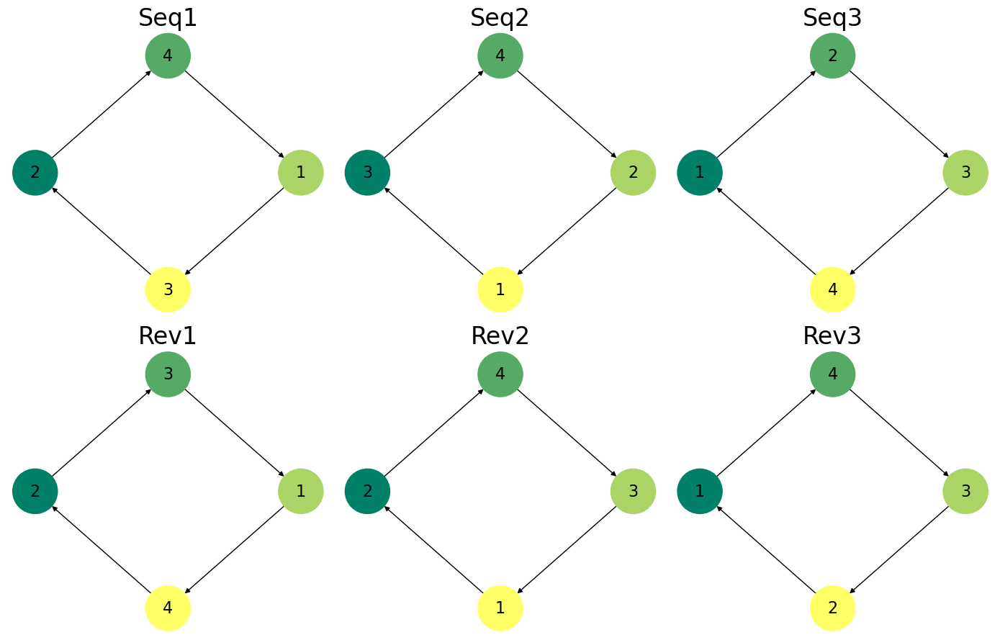

In [3]:
def plot_sequences(all_sequences):
    fig, axes = plt.subplots(2, 3, figsize=(14, 9))  # Arrange plots in a grid
    axes = axes.flatten()  # Flatten to loop over axes

    for ax, (seq_name, sequence) in zip(axes, all_sequences.items()):
        # Create a directed graph for each sequence
        G = nx.DiGraph()
        for i in range(len(sequence)):
            G.add_edge(sequence[i], sequence[(i + 1) % len(sequence)])  # Wrap around to the first well

        # Define node colors based on sequence position (gradient from start to end)
        node_colors = cm.summer(np.linspace(0, 1, len(sequence)))

        # Generate clockwise circular layout
        pos = nx.circular_layout(G)
        for node in pos:
            x, y = pos[node]
            pos[node] = (-x, y)  # Flip the y-coordinate for clockwise layout

        # Draw the graph
        nx.draw(
            G,
            pos,
            ax=ax,
            with_labels=True,
            node_size=2000,
            font_size=16,
            arrows=True,
            node_color=node_colors
        )
        ax.set_title(seq_name, fontsize=24)

    # Adjust layout for clarity
    plt.tight_layout()
    plt.show()

# Visualize the sequences
plot_sequences(all_sequences)


In [4]:
# # Extract Data from Animals
# all_animal_data = {}
# for animal in animals:
#     all_animal_data[animal] = pickle.load(open(os.path.join(datafolder,animal,'behavior_'+animal+'.p'), "rb"))

# all_animal_data

In [5]:
# with open(f"all_animal_data.pkl", "wb") as f:
#     pickle.dump(all_animal_data, f)
with open('pv_animal_data.pkl', 'rb') as f:
    pv_animal_data = pickle.load(f)
pv_animal_data
with open('wt_animal_data.pkl', 'rb') as f:
    wt_animal_data = pickle.load(f)
wt_animal_data

{'Eliot': {'files': ['/cumulus/shijie/behavior_pilot/Batch1/Eliot/processed/20221011_Eliot_Seq0_Session1.mat',
   '/cumulus/shijie/behavior_pilot/Batch1/Eliot/processed/20221011_Eliot_Seq0_Session2.mat',
   '/cumulus/shijie/behavior_pilot/Batch1/Eliot/processed/20221012_Eliot_Seq0_Session1.mat',
   '/cumulus/shijie/behavior_pilot/Batch1/Eliot/processed/20221012_Eliot_Seq0_Session2.mat',
   '/cumulus/shijie/behavior_pilot/Batch1/Eliot/processed/20221012_Eliot_Seq0_Session3.mat',
   '/cumulus/shijie/behavior_pilot/Batch1/Eliot/processed/20221013_Eliot_Seq0_Session1.mat',
   '/cumulus/shijie/behavior_pilot/Batch1/Eliot/processed/20221013_Eliot_Seq0_Session2.mat',
   '/cumulus/shijie/behavior_pilot/Batch1/Eliot/processed/20221014_Eliot_Seq2_Session1.mat',
   '/cumulus/shijie/behavior_pilot/Batch1/Eliot/processed/20221014_Eliot_Seq2_Session2.mat',
   '/cumulus/shijie/behavior_pilot/Batch1/Eliot/processed/20221014_Eliot_Seq2_Session3.mat',
   '/cumulus/shijie/behavior_pilot/Batch1/Eliot/proc

### Plot Occurrence of Sequence Completion

#### PV-Cre

In [6]:
session_results_dict = {}
for curr_animal in pv_animals:
    curr_animal_data = pv_animal_data[curr_animal]
    ordered_indexes = np.argsort(curr_animal_data['date_session']) # making sure that the data is organized properly
    session_results_dict[curr_animal] = np.zeros((len(curr_animal_data['trials']),145,9))+np.nan

    # Loop through sessions for the current animal
    for session_idx in ordered_indexes:
        # Extract trials for the current session
        trials = curr_animal_data['trials'][session_idx]  # Organized as [timestamp_H, Home, timestamp_O, OuterWellIndex, rewardNum]

        # Determine if each trial is rewarded
        if_rewarded = (trials[:, 4] == 2)  # Boolean array: True if reward received at outer well
        end_of_session = np.argwhere(if_rewarded).ravel()[-1]  # Find the index of the last rewarded trial
        trials = trials[np.arange(end_of_session)]  # Trim trials up to the last rewarded trial

        # Extract outer well indices
        outers = trials[:140, 3]  # Limit to 140 trials

        # Calculate running sum of squares for normalization
        running_sum_outer = signal.convolve(outers**2, [1, 1, 1, 1, 1])

        # Loop through each sequence and its reverse to calculate matches
        for seq_idx, (seq_name, seq_pattern) in enumerate(all_sequences.items()):
            conv = np.zeros(len(outers))  # Initialize convolution results
            for p in range(len(seq_pattern)):  # Consider all permutations (shifts) of the sequence
                # Roll sequence to account for shifted matches
                seq_tmp = np.roll(np.hstack((seq_pattern, seq_pattern)), -p)[:5]
                seq_norm = np.linalg.norm(seq_tmp)  # Normalize the template
                
                # Compute convolution between outer wells and flipped sequence template
                conv_tmp = signal.convolve(outers, np.flip(seq_tmp))  # Use 'same' to ensure matching length
                
                # Normalize the convolution result to align with running_sum_outer
                conv_tmp = conv_tmp / (seq_norm * np.sqrt(running_sum_outer))  # Normalize
                conv += np.concatenate(([0,0,0,0],np.abs(conv_tmp[4:-4]-1)<=np.exp(-10)));

            # Get a boolean mask for success
            conv = np.array(conv > 0).astype('int')

            # Save the results in the dictionary
            session_results_dict[curr_animal][session_idx, np.arange((len(outers))), seq_idx] = conv

        # Identify "repeated" patterns in the sequence (order1, order2, order3)
        order1_2 = np.concatenate([[1], np.diff(outers)]) == 0
        order1_1 = np.concatenate([[0, 0], order1_2[:-2]])
        order1_3 = np.concatenate([[0], order1_2[:-1]])
        order1 = ((order1_1.astype(int) + order1_2.astype(int) + order1_3.astype(int)) > 0).astype(int)

        order2_1 = np.concatenate([[1, 1], outers[2:] - outers[:-2]]) == 0
        order2_2 = np.concatenate([[0], order2_1[:-1]])
        order2 = ((order2_1.astype(int) + order2_2.astype(int)) > 0).astype(int)

        order3 = np.concatenate([[1, 1, 1], outers[3:] - outers[:-3]]) == 0

        # Store results for repeated patterns in session_results
        session_results_dict[curr_animal][session_idx, np.arange(len(outers)), 0 + 6] = order1
        session_results_dict[curr_animal][session_idx, np.arange(len(outers)), 1 + 6] = order2
        session_results_dict[curr_animal][session_idx, np.arange(len(outers)), 2 + 6] = order3


    # Summary and explanation calculation
    sum_of_projection = np.sum(session_results_dict[curr_animal], axis=2)
    explained = np.sum((sum_of_projection == 1).flatten()) / np.sum((sum_of_projection == 0).flatten() + (sum_of_projection == 1).flatten())
    print(f"Explained ratio for {curr_animal}: {explained}")

Explained ratio for Marli: 0.7699805068226121
Explained ratio for Mason: 0.7715780296425457
Explained ratio for Micah: 0.7710171853228054


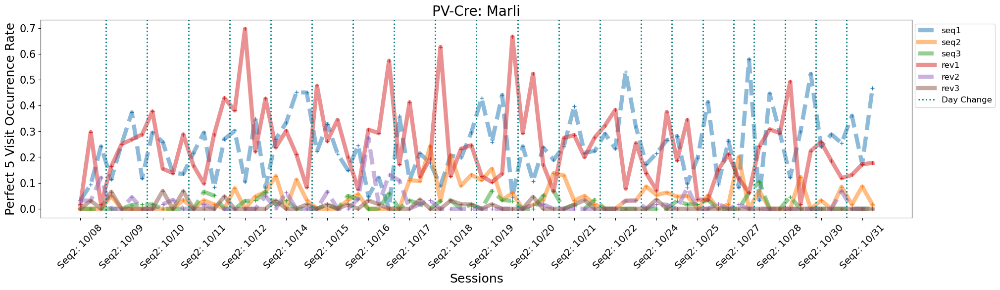

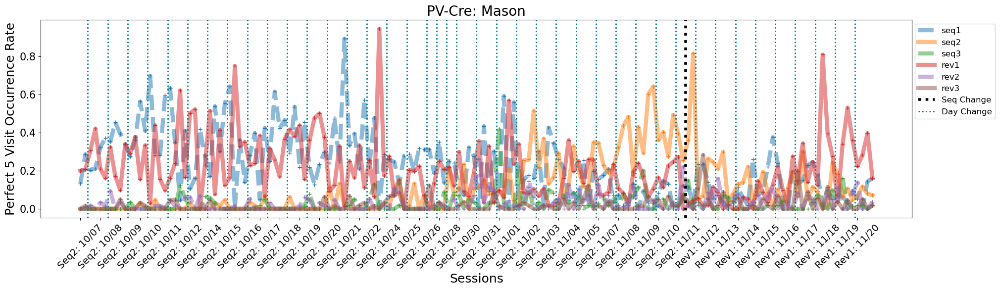

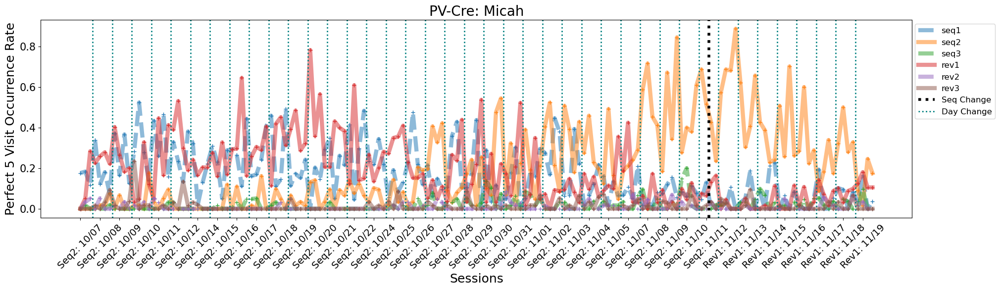

In [7]:
for curr_animal in pv_animals:
    curr_animal_data = pv_animal_data[curr_animal]
    seqtype=np.array([se[3] for se in curr_animal_data['seq']]);
    ordered_indexes = np.argsort(curr_animal_data['date_session']) # making sure that the data is organized properly
    seqtype=seqtype[ordered_indexes]
    seqtype_int=[int(se) for se in seqtype]

    dates=np.array([int(d) for d in curr_animal_data['date']])
    dates=dates[ordered_indexes]
    occurance_rates=[]
    #occurance_rates_random=[]
    lines=[]

    for a in range(9):
        occurance_rate=np.sum(session_results_dict[curr_animal][:,:,a]==1,axis=1)
        occurance_rates.append(occurance_rate)
    
    occurance_rates=occurance_rates/np.sum(occurance_rates,axis=0)

    fig,axes=plt.subplots(1,1,figsize=(22, 5))
    for a in range(6):
        occurance_rate=occurance_rates[a]
        lines1, = axes.plot(
            occurance_rate,
            color= f'C{a}',
            label=orders[a],
            linewidth=6,
            alpha=0.5,
            linestyle='-' if a % 2 == 1 else '--'
        )
        lines.append(lines1)
        axes.plot(occurance_rate,'+',color= f'C{a}')

    axes.legend(handles=lines,fontsize=16,bbox_to_anchor=(1.05, 1))
    axes.set_position([0.06,0.11,0.8,0.8])

    # Add sequence and day change lines
    sequence_change = np.argwhere(np.diff(seqtype_int)).ravel() + 1
    day_change = np.argwhere(np.diff(dates)).ravel() + 1
    y3 = axes.get_ylim()

    for t in sequence_change:
        axes.axvline(t - 0.5, color='k', linestyle=':', linewidth=4, label='Seq Change' if t == sequence_change[0] else None)
    for t in day_change:
        axes.axvline(t - 0.5, color='teal', linestyle=':', linewidth=2, label='Day Change' if t == day_change[0] else None)

    # Customize x-tick labels
    dates=curr_animal_data['date'];
    assert len(dates)==len(seqtype)
    seqtype_d=[list(all_sequences.keys())[int(seqtype[d])-1]+': '+ dates[d][-4:-2] + "/" + dates[d][-2:] for d in range(len(dates))]
    axes.set_xticks(np.arange(0, len(seqtype), 4)) # Show every 2nd tick
    axes.set_xticklabels(seqtype_d[::4], fontsize = 14, rotation = 45);
    plt.yticks(fontsize=15);

    # Customize legend
    axes.legend(fontsize=12, loc='upper right', bbox_to_anchor=(1.10, 1))

    axes.set_title("PV-Cre: " + curr_animal,fontsize= 20);
    axes.set_ylabel('Perfect 5 Visit Occurrence Rate', fontsize=18)
    axes.set_xlabel('Sessions', fontsize=18)
        
    plt.savefig(os.path.join(figurefolder,'C2_rate_of_sequence_'+curr_animal+'.png'), dpi=500, bbox_inches='tight')

#### WT

In [8]:
# take out the seq 0 sessions from Eliot
take_out_eliot_sessions = []
for idx, f in enumerate(wt_animal_data['Eliot']['files']):
    if "Seq0" in f:
        take_out_eliot_sessions.append(idx)
take_out_eliot_sessions
filtered_data = {}
for key, value in wt_animal_data['Eliot'].items():
    filtered_data[key] = [v for i, v in enumerate(value) if i not in take_out_eliot_sessions]
wt_animal_data['Eliot'] = filtered_data

In [9]:
wt_session_results_dict = {}
for curr_animal in wt_animals:
    curr_animal_data = wt_animal_data[curr_animal]
    ordered_indexes = np.argsort(curr_animal_data['date_session']) # making sure that the data is organized properly
    wt_session_results_dict[curr_animal] = np.zeros((len(curr_animal_data['trials']),145,9))+np.nan

    # Loop through sessions for the current animal
    for session_idx in ordered_indexes:
        # Extract trials for the current session
        trials = curr_animal_data['trials'][session_idx]  # Organized as [timestamp_H, Home, timestamp_O, OuterWellIndex, rewardNum]

        # Determine if each trial is rewarded
        if_rewarded = (trials[:, 4] == 2)  # Boolean array: True if reward received at outer well
        end_of_session = np.argwhere(if_rewarded).ravel()[-1]  # Find the index of the last rewarded trial
        trials = trials[np.arange(end_of_session)]  # Trim trials up to the last rewarded trial

        # Extract outer well indices
        outers = trials[:140, 3]  # Limit to 140 trials

        # Calculate running sum of squares for normalization
        running_sum_outer = signal.convolve(outers**2, [1, 1, 1, 1, 1])

        # Loop through each sequence and its reverse to calculate matches
        for seq_idx, (seq_name, seq_pattern) in enumerate(all_sequences.items()):
            conv = np.zeros(len(outers))  # Initialize convolution results
            for p in range(len(seq_pattern)):  # Consider all permutations (shifts) of the sequence
                # Roll sequence to account for shifted matches
                seq_tmp = np.roll(np.hstack((seq_pattern, seq_pattern)), -p)[:5]
                seq_norm = np.linalg.norm(seq_tmp)  # Normalize the template
                
                # Compute convolution between outer wells and flipped sequence template
                conv_tmp = signal.convolve(outers, np.flip(seq_tmp))  # Use 'same' to ensure matching length
                
                # Normalize the convolution result to align with running_sum_outer
                conv_tmp = conv_tmp / (seq_norm * np.sqrt(running_sum_outer))  # Normalize
                conv += np.concatenate(([0,0,0,0],np.abs(conv_tmp[4:-4]-1)<=np.exp(-10)));

            # Get a boolean mask for success
            conv = np.array(conv > 0).astype('int')

            # Save the results in the dictionary
            wt_session_results_dict[curr_animal][session_idx, np.arange((len(outers))), seq_idx] = conv

        # Identify "repeated" patterns in the sequence (order1, order2, order3)
        order1_2 = np.concatenate([[1], np.diff(outers)]) == 0
        order1_1 = np.concatenate([[0, 0], order1_2[:-2]])
        order1_3 = np.concatenate([[0], order1_2[:-1]])
        order1 = ((order1_1.astype(int) + order1_2.astype(int) + order1_3.astype(int)) > 0).astype(int)

        order2_1 = np.concatenate([[1, 1], outers[2:] - outers[:-2]]) == 0
        order2_2 = np.concatenate([[0], order2_1[:-1]])
        order2 = ((order2_1.astype(int) + order2_2.astype(int)) > 0).astype(int)

        order3 = np.concatenate([[1, 1, 1], outers[3:] - outers[:-3]]) == 0

        # Store results for repeated patterns in session_results
        wt_session_results_dict[curr_animal][session_idx, np.arange(len(outers)), 0 + 6] = order1
        wt_session_results_dict[curr_animal][session_idx, np.arange(len(outers)), 1 + 6] = order2
        wt_session_results_dict[curr_animal][session_idx, np.arange(len(outers)), 2 + 6] = order3


    # Summary and explanation calculation
    sum_of_projection = np.sum(wt_session_results_dict[curr_animal], axis=2)
    explained = np.sum((sum_of_projection == 1).flatten()) / np.sum((sum_of_projection == 0).flatten() + (sum_of_projection == 1).flatten())
    print(f"Explained ratio for {curr_animal}: {explained}")

Explained ratio for Eliot: 0.7486055260085615
Explained ratio for Julio: 0.7450287807430664
Explained ratio for Lewis: 0.7318034306907742
Explained ratio for Haydn: 0.76321058587969


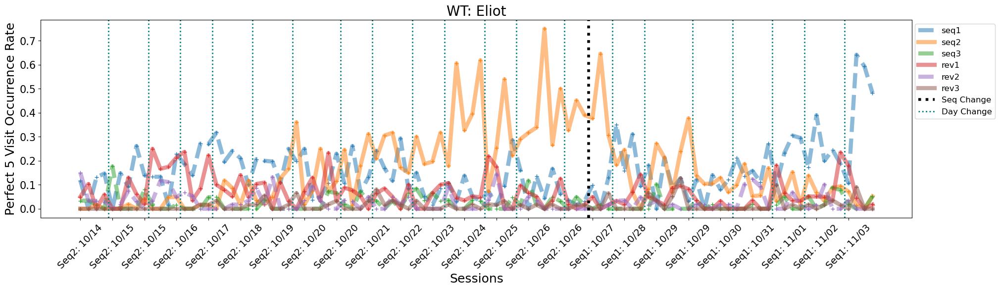

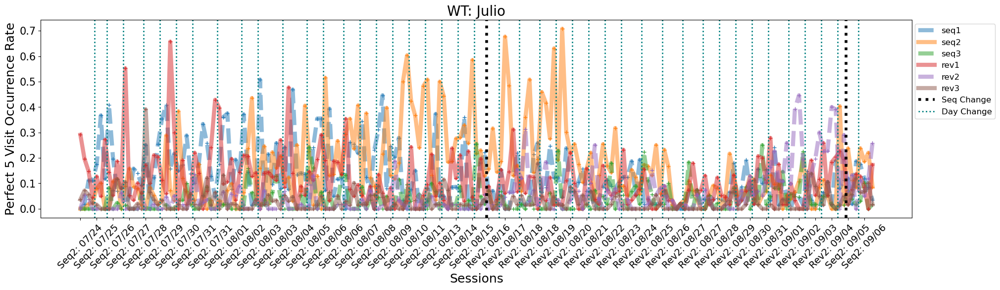

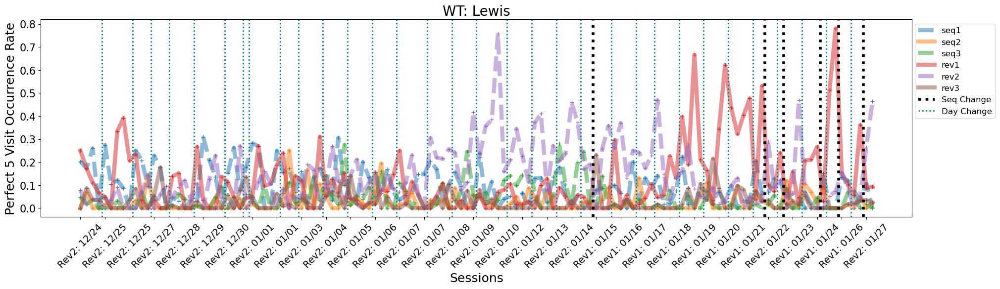

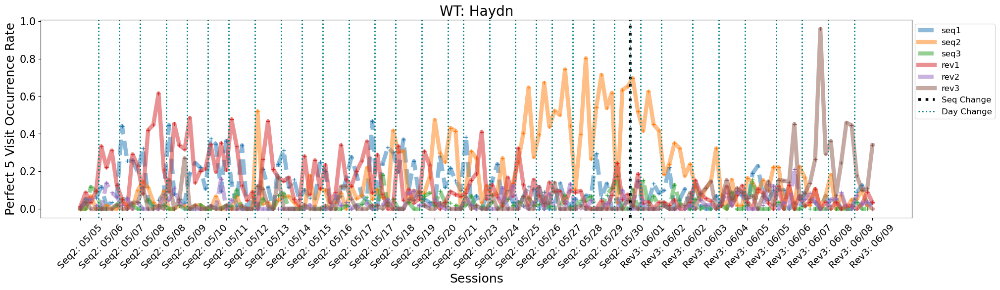

In [10]:
for curr_animal in wt_animals:
    curr_animal_data = wt_animal_data[curr_animal]
    seqtype=np.array([se[3] for se in curr_animal_data['seq']]);
    ordered_indexes = np.argsort(curr_animal_data['date_session']) # making sure that the data is organized properly
    seqtype=seqtype[ordered_indexes]
    seqtype_int=[int(se) for se in seqtype]

    dates=np.array([int(d) for d in curr_animal_data['date']])
    dates=dates[ordered_indexes]
    occurance_rates=[]
    #occurance_rates_random=[]
    lines=[]

    for a in range(9):
        occurance_rate=np.sum(wt_session_results_dict[curr_animal][:,:,a]==1,axis=1)
        occurance_rates.append(occurance_rate)
    
    occurance_rates=occurance_rates/np.sum(occurance_rates,axis=0)

    fig,axes=plt.subplots(1,1,figsize=(22, 5))
    for a in range(6):
        occurance_rate=occurance_rates[a]
        lines1, = axes.plot(
            occurance_rate,
            color= f'C{a}',
            label=orders[a],
            linewidth=6,
            alpha=0.5,
            linestyle='-' if a % 2 == 1 else '--'
        )
        lines.append(lines1)
        axes.plot(occurance_rate,'+',color= f'C{a}')

    axes.legend(handles=lines,fontsize=16,bbox_to_anchor=(1.05, 1))
    axes.set_position([0.06,0.11,0.8,0.8])

    # Add sequence and day change lines
    sequence_change = np.argwhere(np.diff(seqtype_int)).ravel() + 1
    day_change = np.argwhere(np.diff(dates)).ravel() + 1
    y3 = axes.get_ylim()

    for t in sequence_change:
        axes.axvline(t - 0.5, color='k', linestyle=':', linewidth=4, label='Seq Change' if t == sequence_change[0] else None)
    for t in day_change:
        axes.axvline(t - 0.5, color='teal', linestyle=':', linewidth=2, label='Day Change' if t == day_change[0] else None)

    # Customize x-tick labels
    dates=curr_animal_data['date'];
    assert len(dates)==len(seqtype)
    seqtype_d=["Seq" + seqtype[d]+': '+ dates[d][-4:-2] + "/" + dates[d][-2:] for d in range(len(dates))]
    seqtype_d=[list(all_sequences.keys())[int(seqtype[d])-1]+': '+ dates[d][-4:-2] + "/" + dates[d][-2:] for d in range(len(dates))]
    axes.set_xticks(np.arange(0, len(seqtype), 4)) # Show every 2nd tick
    axes.set_xticklabels(seqtype_d[::4], fontsize = 14, rotation = 45);
    plt.yticks(fontsize=15);

    # Customize legend
    axes.legend(fontsize=12, loc='upper right', bbox_to_anchor=(1.10, 1))

    axes.set_title("WT: " + curr_animal,fontsize= 20);
    axes.set_ylabel('Perfect 5 Visit Occurrence Rate', fontsize=18)
    axes.set_xlabel('Sessions', fontsize=18)
        
    plt.savefig(os.path.join(figurefolder,'C2_rate_of_sequence_'+curr_animal+'.png'), dpi=500, bbox_inches='tight')

In [11]:
wt_animal_data['Eliot']['date'][0], wt_animal_data['Julio']['date'][0], wt_animal_data['Haydn']['date'][0]

('20221014', '20230724', '20230505')

### Plotting Shifts in Transition Matrices

In [12]:
curr_animal = pv_animals[2]

In [13]:
curr_animal = pv_animals[2]
curr_animal_data = pv_animal_data[curr_animal]

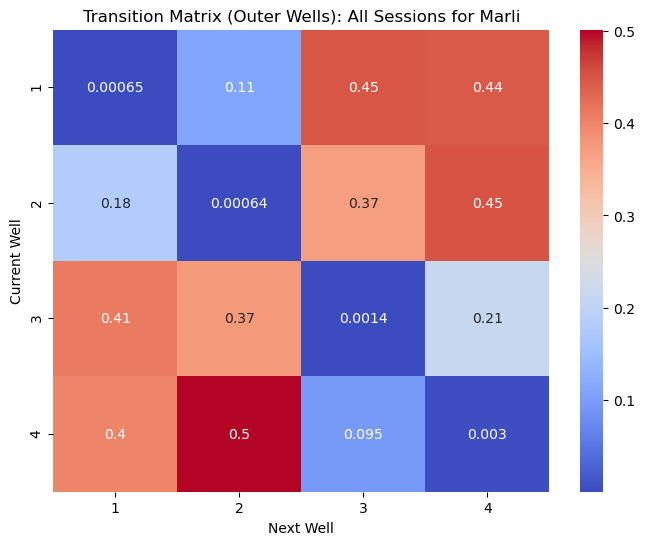

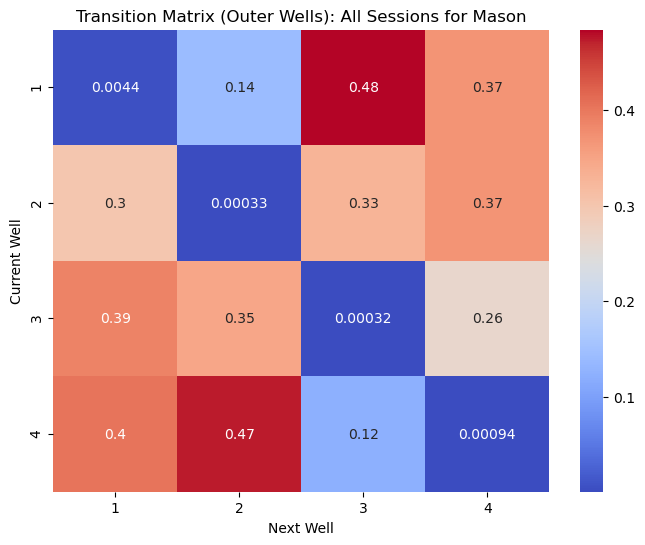

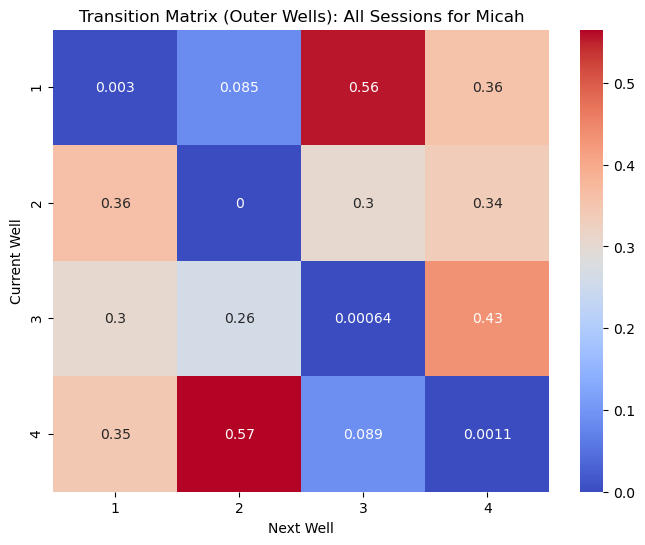

In [14]:
for curr_animal in pv_animals:
    curr_animal_data = pv_animal_data[curr_animal]
    # Initialize transition matrix
    num_wells = 4  # Outer wells (1–4)
    transition_matrix = np.zeros((num_wells, num_wells))  # Rows = current well, Columns = next well

    for session_idx, session_trials in enumerate(curr_animal_data['trials']):
        # Extract outer well indices (ignore homewell visits)
        outers = session_trials[:, 3]
        outers = outers[outers > 0]  # Filter out homewell visits (assuming homewell index is 0)

        # Compare with seq2
        seq2_pattern = all_sequences["Seq2"]
        for trial_idx, curr_well in enumerate(outers[:-1]):
            next_well = outers[trial_idx + 1]
            
            # Update transition matrix
            transition_matrix[int(curr_well) - 1, int(next_well) - 1] += 1

    # Normalize transition matrix
    transition_matrix = transition_matrix / transition_matrix.sum(axis=1, keepdims=True)

    plt.figure(figsize=(8, 6))
    sns.heatmap(transition_matrix, annot=True, cmap="coolwarm", xticklabels=[1, 2, 3, 4], yticklabels=[1, 2, 3, 4])
    plt.title(f"Transition Matrix (Outer Wells): All Sessions for {curr_animal}")
    plt.xlabel("Next Well")
    plt.ylabel("Current Well")
    plt.show()

In [15]:
def plot_transition_matrices_per_day(curr_animal_data, animal, num_wells = 4):
    # Initialize dictionary to store transition matrices for each day
    daily_transition_matrices = defaultdict(lambda: np.zeros((num_wells, num_wells)))

    # Loop through sessions grouped by day
    unique_dates = np.unique(curr_animal_data['date'])
    for date in unique_dates:
        session_indices = np.where(np.array(curr_animal_data['date']) == date)[0]
        
        # Sum transitions across sessions for this date
        for session_idx in session_indices:
            trials = curr_animal_data['trials'][session_idx]
            
            # Extract outer well indices
            outers = trials[:, 3]
            outers = outers[outers > 0]  # Filter out homewell visits
            
            # Update daily transition matrix
            for trial_idx, curr_well in enumerate(outers[:-1]):
                next_well = outers[trial_idx + 1]
                daily_transition_matrices[date][int(curr_well) - 1, int(next_well) - 1] += 1

    # Normalize each daily transition matrix
    for date in unique_dates:
        daily_transition_matrices[date] /= daily_transition_matrices[date].sum(axis=1, keepdims=True)

    # Plot heatmaps for each day with adjusted aspect ratio
    plt.figure(figsize=(20, 20))  # Increase height to avoid stretching

    n_cols = 5  # Number of columns
    n_rows = -(-len(unique_dates) // n_cols)  # Compute rows to fit all heatmaps

    for i, date in enumerate(unique_dates):
        plt.subplot(n_rows, n_cols, i + 1)  # Dynamically adjust the subplot grid
        sns.heatmap(
            daily_transition_matrices[date],
            annot=True,
            cmap="coolwarm",
            xticklabels=[1, 2, 3, 4],
            yticklabels=[1, 2, 3, 4],
            cbar=False,
            square=True  # Make each heatmap square
        )
        plt.title(f"{date[4:6]}/{date[6:]}")
        plt.xlabel("Next Well")
        plt.ylabel("Current Well")
    
    plt.suptitle(f'PV-Cre {animal}')
    plt.tight_layout()  # Adjust layout to avoid overlap
    plt.show()

# for animal in pv_animals:
#     plot_transition_matrices_per_day(pv_animal_data[animal], animal)

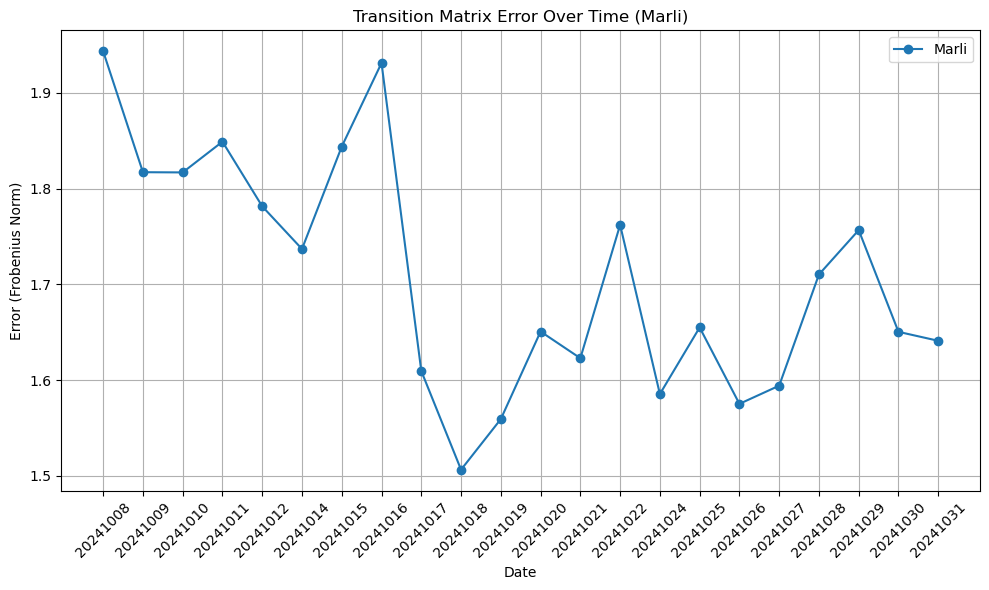

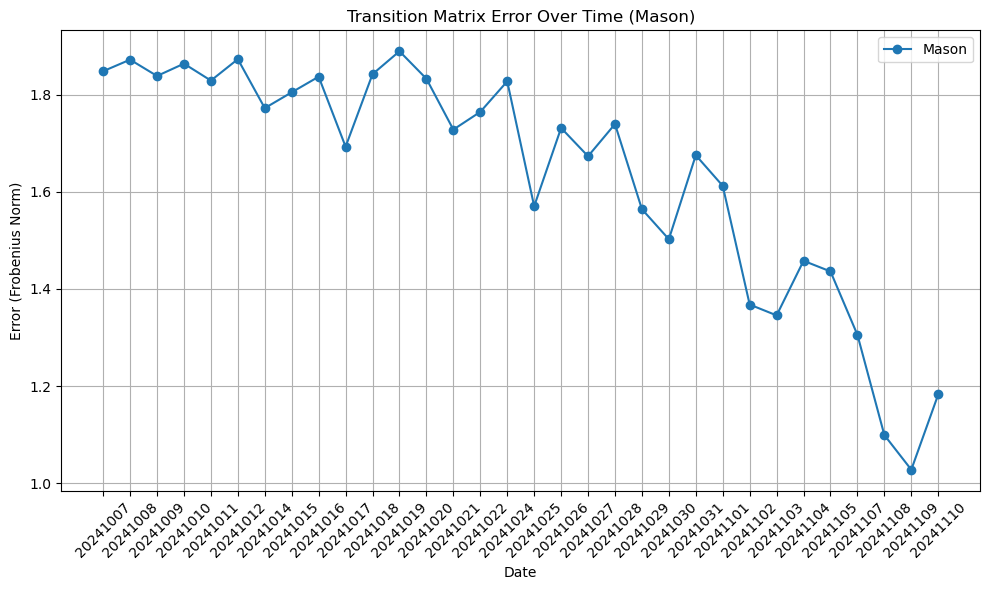

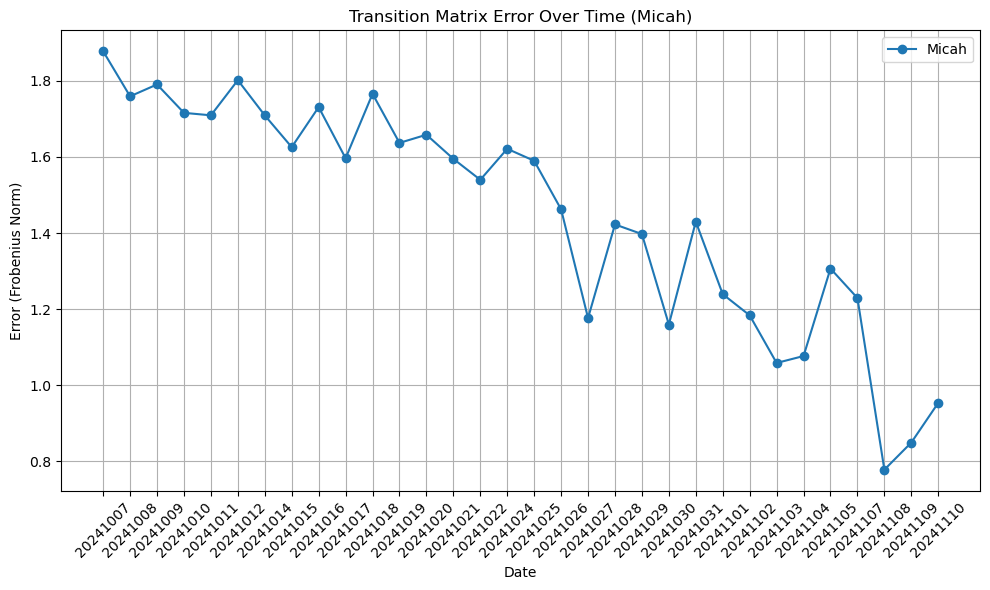

In [16]:
import seaborn as sns
from collections import defaultdict

# Target sequence transition matrix for seq2
seq2_transition_matrix = np.zeros((4, 4))
seq2 = [3, 4, 2, 1]  # Seq2 target sequence
for i in range(len(seq2)):
    current = seq2[i] - 1  # Adjust for 0-indexing
    next = seq2[(i + 1) % len(seq2)] - 1  # Wrap-around to create a cycle
    seq2_transition_matrix[current, next] += 1
seq2_transition_matrix /= seq2_transition_matrix.sum(axis=1, keepdims=True)

# Function to calc daily transition matrices
def compute_daily_transition_matrices(curr_animal_data, valid_indices):
    daily_transition_matrices = defaultdict(lambda: np.zeros((4, 4)))
    unique_dates = np.unique([curr_animal_data['date'][i] for i in valid_indices])
    for date in unique_dates:
        session_indices = [
            i for i in valid_indices if curr_animal_data['date'][i] == date
        ]
        for session_idx in session_indices:
            trials = curr_animal_data['trials'][session_idx]
            outers = trials[:, 3]
            outers = outers[outers > 0]
            for trial_idx, curr_well in enumerate(outers[:-1]):
                next_well = outers[trial_idx + 1]
                daily_transition_matrices[date][int(curr_well) - 1, int(next_well) - 1] += 1
        daily_transition_matrices[date] /= daily_transition_matrices[date].sum(
            axis=1, keepdims=True
        )
    return daily_transition_matrices

# Compute errors for each day
def plot_transition_matrix_error(animal_name, curr_animal_data, cutoff_date="20241110"):
    if animal_name in ["Micah", "Mason"]:
        valid_indices = [
            i for i, date in enumerate(curr_animal_data['date']) if int(date) <= int(cutoff_date)
        ]
    else:
        valid_indices = list(range(len(curr_animal_data['trials'])))
    daily_transition_matrices = compute_daily_transition_matrices(curr_animal_data, valid_indices)
    
    dates = sorted(daily_transition_matrices.keys())
    errors = []
    for date in dates:
        error = np.linalg.norm(
            daily_transition_matrices[date] - seq2_transition_matrix
        )
        errors.append(error)
    
    # Plot errors over time
    plt.figure(figsize=(10, 6))
    plt.plot(dates, errors, marker="o", linestyle="-", label=animal_name)
    plt.xticks(range(0, len(dates), max(1, len(dates) // len(dates))), rotation=45)  # Adjust for readability
    plt.xlabel("Date")
    plt.ylabel("Error (Frobenius Norm)")
    plt.title(f"Transition Matrix Error Over Time ({animal_name})")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

for animal_name in pv_animals:
    curr_animal_data = pv_animal_data[animal_name]
    plot_transition_matrix_error(animal_name, curr_animal_data)

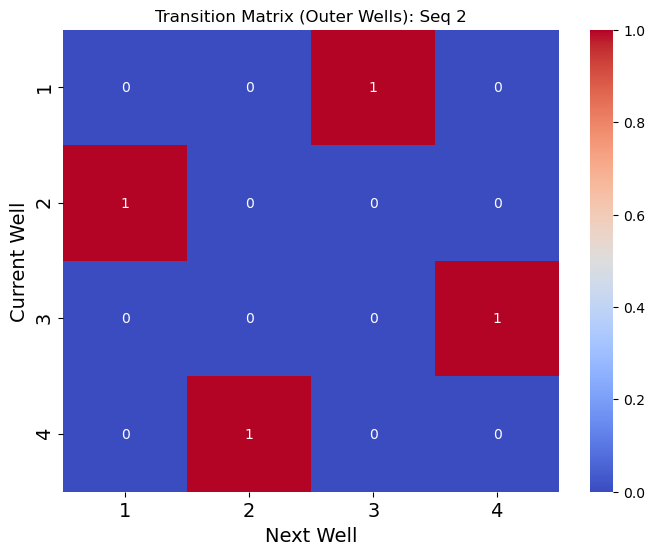

In [17]:
plt.figure(figsize=(8, 6))
sns.heatmap(seq2_transition_matrix, annot=True, cmap="coolwarm", xticklabels=[1, 2, 3, 4], yticklabels=[1, 2, 3, 4])
plt.title(f"Transition Matrix (Outer Wells): Seq 2")
# Customize tick sizes
plt.xticks(fontsize=14)  # Increase x-tick font size
plt.yticks(fontsize=14)  # Increase y-tick font size
plt.xlabel("Next Well", fontsize= 14)
plt.ylabel("Current Well", fontsize= 14)
plt.show()

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


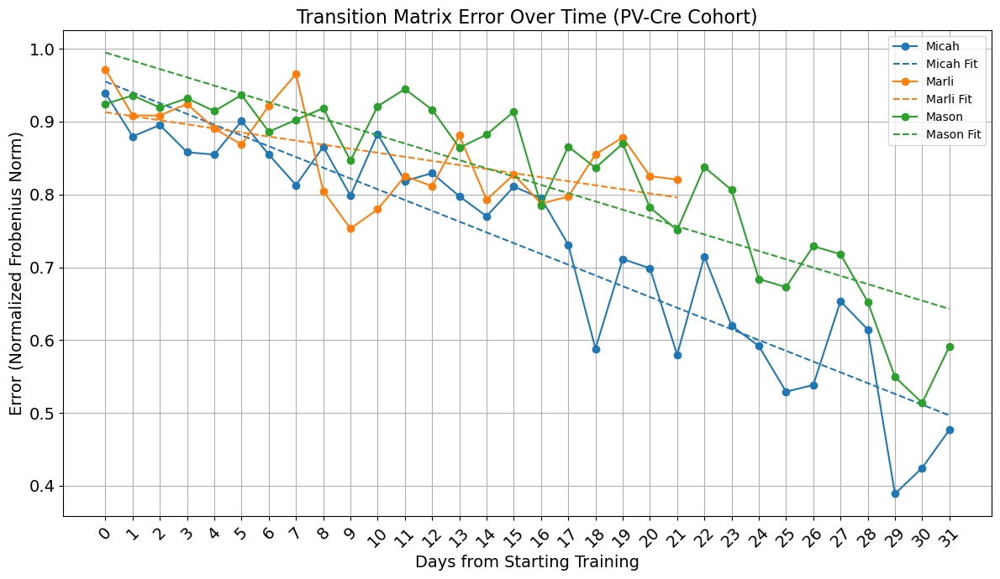

In [18]:
# Compute errors for each day
def all_animals_plot_transition_matrix_error(cutoff_date="20241110"):
    # Plot errors over time
    pv_regression_results = {}
    plt.figure(figsize=(12, 7))
    for curr_animal, curr_color in zip(['Micah', 'Marli', 'Mason'],['#1f77b4', '#ff7f0e', '#2ca02c']):
        curr_animal_data = pv_animal_data[curr_animal]  # Example dataset
        
        if curr_animal in ["Micah", "Mason"]:
            valid_indices = [
                i for i, date in enumerate(curr_animal_data['date']) if int(date) <= int(cutoff_date)
            ]
        else:
            valid_indices = list(range(len(curr_animal_data['trials'])))
        daily_transition_matrices = compute_daily_transition_matrices(curr_animal_data, valid_indices)
        
        dates = sorted(daily_transition_matrices.keys())
        errors = []
        for date in dates:
            error = np.linalg.norm(
                daily_transition_matrices[date] - seq2_transition_matrix
            )
            error = np.linalg.norm(daily_transition_matrices[date] - seq2_transition_matrix) / np.linalg.norm(seq2_transition_matrix)
            errors.append(error)

        days_passed = np.arange(len(dates))

        # Fit regression
        slope, intercept, r_value, p_value, std_err = linregress(days_passed, errors)
        pv_regression_results[curr_animal] = {
            "slope": slope,
            "intercept": intercept,
            "r_value": r_value,
            "p_value": p_value,
            "std_err": std_err,
        }
        # Plot error and regression line
        plt.plot(days_passed, errors, marker="o", linestyle="-", label=curr_animal, color = curr_color)
        plt.plot(days_passed, slope * days_passed + intercept, linestyle="--", label=f"{curr_animal} Fit", color = curr_color)
       
    #plt.xticks(range(0, len(dates), max(1, len(dates) // len(dates)/4)), rotation=45)  # Adjust ticks for readability
    plt.xticks(range(0, len(dates), max(1, len(dates) // len(dates)/2)), rotation=45, fontsize = 14)
    plt.yticks(fontsize = 14)
    plt.xlabel("Days from Starting Training", fontsize = 14)
    plt.ylabel("Error (Normalized Frobenius Norm)", fontsize = 14)
    plt.title("Transition Matrix Error Over Time (PV-Cre Cohort)", fontsize = 16)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return pv_regression_results
    
pv_regression_results = all_animals_plot_transition_matrix_error()

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


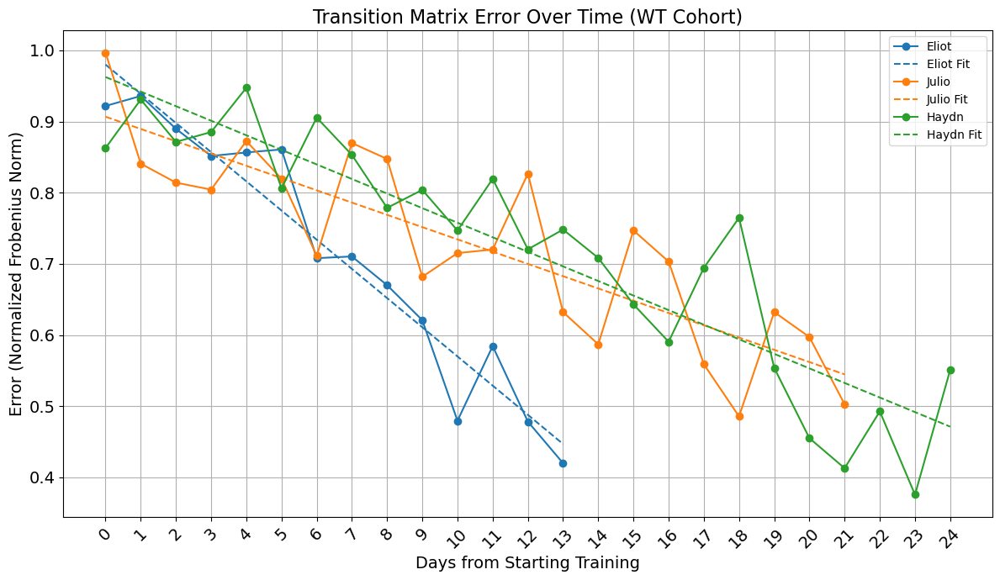

In [19]:
# Threshold dates for each animal
wt_end_dates = {
    "Eliot": "20221027",
    "Julio": "20230815",
    "Haydn": "20230530",
}

# Define the seq2 transition matrix programmatically
seq2_transition_matrix = np.zeros((4, 4))
seq2 = [3, 4, 2, 1]  # Seq2 target sequence
for i in range(len(seq2)):
    current = seq2[i] - 1  # Adjust for 0-indexing
    next = seq2[(i + 1) % len(seq2)] - 1  # Wrap-around to create a cycle
    seq2_transition_matrix[current, next] += 1
seq2_transition_matrix /= seq2_transition_matrix.sum(axis=1, keepdims=True)

def compute_daily_transition_matrices_wt(curr_animal_data, valid_indices):
    daily_transition_matrices = defaultdict(lambda: np.zeros((4, 4)))  # 4 wells in seq2

    for session_idx in valid_indices:
        trials = curr_animal_data['trials'][session_idx]
        
        # Extract outer well indices
        outers = trials[:, 3]
        outers = outers[outers > 0]  # Filter out homewell visits

        # Update daily transition matrix
        for trial_idx, curr_well in enumerate(outers[:-1]):
            next_well = outers[trial_idx + 1]
            daily_transition_matrices[curr_animal_data['date'][session_idx]][int(curr_well) - 1, int(next_well) - 1] += 1

    # Normalize transition matrices
    for date in daily_transition_matrices:
        matrix = daily_transition_matrices[date]
        if matrix.sum(axis=1).any():
            daily_transition_matrices[date] /= matrix.sum(axis=1, keepdims=True)

    return daily_transition_matrices

def wt_animals_plot_transition_matrix_error():
    plt.figure(figsize=(12, 7))
    wt_regression_results = {}
    for curr_animal, curr_color in zip(['Eliot', 'Julio', 'Haydn'],['#1f77b4', '#ff7f0e', '#2ca02c']):
        curr_animal_data = wt_animal_data[curr_animal]
        end_date = wt_end_dates[curr_animal]
        
        valid_indices = [
            i for i, date in enumerate(curr_animal_data['date']) if int(date) <= int(end_date)
        ]
        daily_transition_matrices = compute_daily_transition_matrices_wt(curr_animal_data, valid_indices)
        
        dates = sorted(daily_transition_matrices.keys())
        days_passed = np.arange(len(dates))  
        errors = []
        
        for date in dates:
            error = np.linalg.norm(
                daily_transition_matrices[date] - seq2_transition_matrix
            ) / np.linalg.norm(seq2_transition_matrix)  # Normalized Frobenius norm
            errors.append(error)
        
        # Fit regression
        slope, intercept, r_value, p_value, std_err = linregress(days_passed, errors)
        wt_regression_results[curr_animal] = {
            "slope": slope,
            "intercept": intercept,
            "r_value": r_value,
            "p_value": p_value,
            "std_err": std_err,
        }
        
        # Plot error and regression line
        plt.plot(days_passed, errors, marker="o", linestyle="-", label=curr_animal, color = curr_color)
        plt.plot(days_passed, slope * days_passed + intercept, linestyle="--", label=f"{curr_animal} Fit", color = curr_color)
    
    plt.xticks(range(0, len(dates), max(1, len(dates) // len(dates)/2)), rotation=45, fontsize = 14)
    plt.yticks(fontsize = 14)
    plt.xlabel("Days from Starting Training", fontsize = 14)
    plt.ylabel("Error (Normalized Frobenius Norm)", fontsize = 14)
    plt.title("Transition Matrix Error Over Time (WT Cohort)", fontsize = 16)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return wt_regression_results

wt_regression_results = {}
wt_regression_results = wt_animals_plot_transition_matrix_error()

In [20]:
pv_regression_results

{'Micah': {'slope': -0.014784331053849797,
  'intercept': 0.9549564109211643,
  'r_value': -0.9210454648027074,
  'p_value': 8.068726769768304e-14,
  'std_err': 0.0011413460634166243},
 'Marli': {'slope': -0.005576182754538384,
  'intercept': 0.9130321957152403,
  'r_value': -0.5884960826866626,
  'p_value': 0.003963134122654222,
  'std_err': 0.0017130044288461211},
 'Mason': {'slope': -0.011355282697648291,
  'intercept': 0.9948984161374168,
  'r_value': -0.8751311153116977,
  'p_value': 5.7005290929029126e-11,
  'std_err': 0.0011463233384526104}}

In [21]:
wt_regression_results

{'Eliot': {'slope': -0.04100661141839587,
  'intercept': 0.9799435992849629,
  'r_value': -0.9676873081403927,
  'p_value': 1.5327360304386363e-08,
  'std_err': 0.003084557188093399},
 'Julio': {'slope': -0.01723942155407235,
  'intercept': 0.9067414891705587,
  'r_value': -0.8450237871790814,
  'p_value': 7.485086111354854e-07,
  'std_err': 0.002439339588453309},
 'Haydn': {'slope': -0.020470889142248143,
  'intercept': 0.9624967456561226,
  'r_value': -0.905557883496148,
  'p_value': 4.9018760386557e-10,
  'std_err': 0.00199963394735327}}

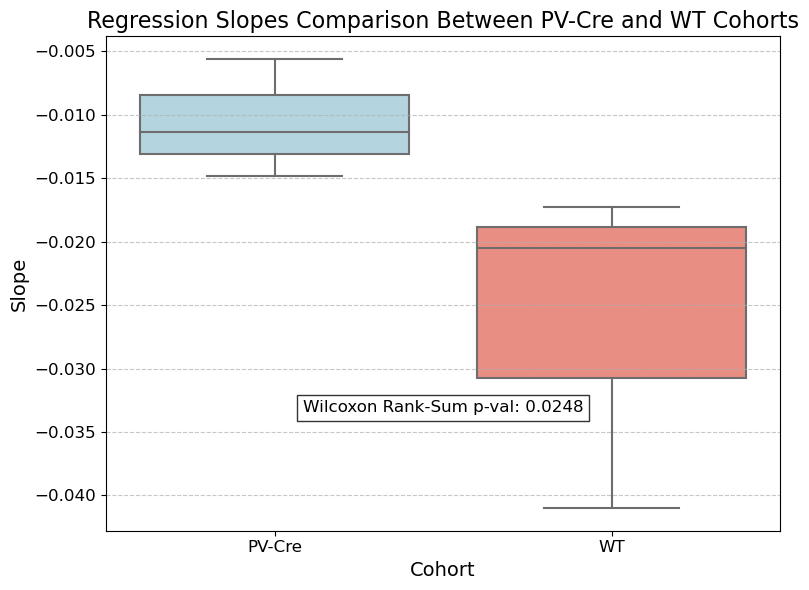

In [22]:
# Extract slopes from the regression results for boxplot comparison
pv_slopes = [result["slope"] for result in pv_regression_results.values()]
wt_slopes = [result["slope"] for result in wt_regression_results.values()]

# Perform Wilcoxon rank-sum test
from scipy.stats import ranksums
stat, p_value = ranksums(pv_slopes, wt_slopes, alternative = 'greater')

# Create a DataFrame for sns boxplot
import pandas as pd
data = pd.DataFrame({
    "Slope": pv_slopes + wt_slopes,
    "Cohort": ["PV-Cre"] * len(pv_slopes) + ["WT"] * len(wt_slopes)
})

# Plot the boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(x="Cohort", y="Slope", data=data, palette=["lightblue", "salmon"])
plt.title("Regression Slopes Comparison Between PV-Cre and WT Cohorts", fontsize=16)
plt.ylabel("Slope", fontsize=14)
plt.xlabel("Cohort", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate the plot with the Wilcoxon test result
plt.text(0.5, max(data["Slope"]) * 6, f"Wilcoxon Rank-Sum p-val: {p_value:.4f}", 
         ha='center', fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

### New

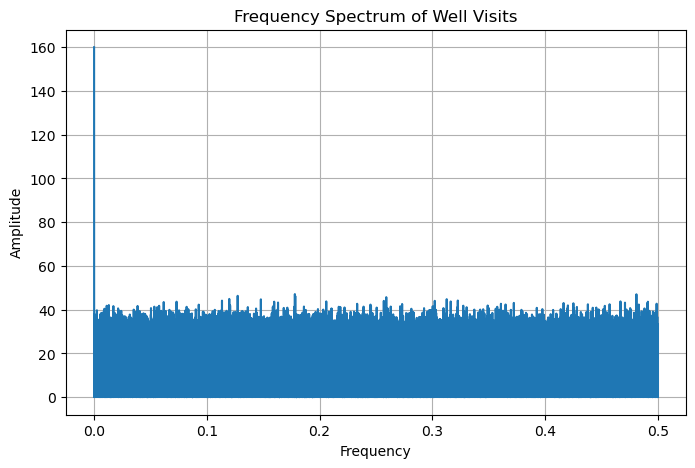

In [16]:
from scipy.fft import fft, fftfreq
import numpy as np
import matplotlib.pyplot as plt
import math

# Convert well visits into a binary time series (1 for well visits, 0 otherwise)
def well_visit_time_series(trials, total_time=1000, time_step=1):
    total_time = int(trials[-1][0])
    time_series = np.zeros(total_time // time_step)
    for idx, trial in enumerate(trials):
        if math.isnan(trial[0]) or math.isnan(trial[2]):
            continue
        home_time = int(trial[0] / time_step)  # Timestamp at home well
        outer_time = int(trial[2] / time_step)  # Timestamp at outer well
        time_series[home_time] = 1
        time_series[outer_time] = 1
    return time_series

# Example for one session
session_data = curr_animal_data['trials'][40]
time_series = well_visit_time_series(session_data)

# Apply FFT
fft_result = fft(time_series)
frequencies = fftfreq(len(time_series), d=1)  # Sampling interval = 1

# Plot the frequency spectrum
plt.figure(figsize=(8, 5))
plt.plot(frequencies[:len(frequencies)//2], np.abs(fft_result)[:len(fft_result)//2])
plt.xlabel('Frequency')
plt.ylabel('Amplitude')
plt.title('Frequency Spectrum of Well Visits')
plt.grid()
plt.show()

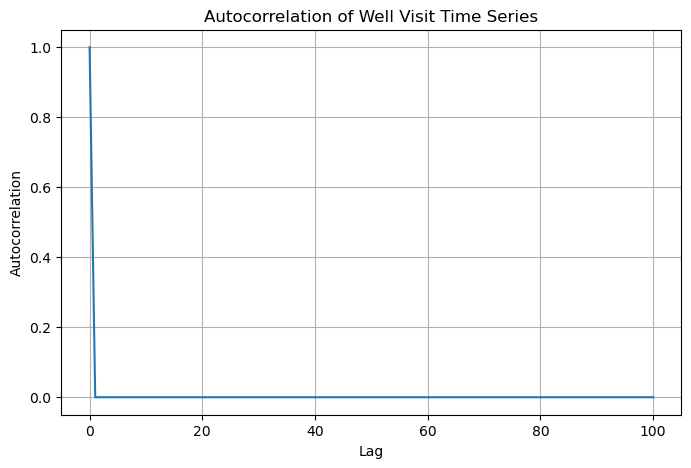

In [17]:
from statsmodels.tsa.stattools import acf

# Compute autocorrelation
autocorr = acf(time_series, nlags=100)

# Plot the autocorrelation function
plt.figure(figsize=(8, 5))
plt.plot(autocorr)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation of Well Visit Time Series')
plt.grid()
plt.show()

### Hidden Markov Model with Home Well

In [24]:
def pv_animals_segment_trials_by_phases(animal_name):
    # Extract trials and dates from the animal's data
    trials = pv_animal_data[animal_name]['trials']
    dates = pv_animal_data[animal_name]['date']

    # Determine the cutoff date for sequence switching
    cutoff_date = "20241110"  # Ensure YYYYMMDD format for proper comparison
    
    # Determine if we need to filter based on sequence switching
    if animal_name in ["Micah", "Mason"]:
        # Filter out trials beyond the cutoff date
        valid_indices = [i for i, date in enumerate(dates) if int(date) <= int(cutoff_date)]
    else:  # 'Marli' and others have no cutoff
        valid_indices = list(range(len(trials)))
    
    # Extract valid trials
    valid_trials = [trials[i] for i in valid_indices]
    
    # Concatenate all valid trials into a single list of trials
    all_trials = []
    for sess in valid_trials:
        sess = sess[:-1]  # Exclude the last trial if it's a throwaway
        for trial in sess:
            all_trials.append(trial)
    
    # Compute the total number of trials and determine split points
    num_trials = len(all_trials)
    split_early = num_trials // 3
    split_mid = 2 * num_trials // 3

    # Split into early, mid, and late phases
    early_trials = all_trials[:split_early]
    mid_trials = all_trials[split_early:split_mid]
    late_trials = all_trials[split_mid:]
    
    # Convert trials back into sequences with interleaved home/outer well visits
    def convert_to_sequence(trials):
        sequence = []
        for trial in trials:
            sequence.append(0)  # Home well
            sequence.append(trial[3])  # Outer well
        return np.array(sequence)

    early_phase = convert_to_sequence(early_trials)
    mid_phase = convert_to_sequence(mid_trials)
    late_phase = convert_to_sequence(late_trials)

    phase_dictionary = {
        "Early": early_phase.astype(int),
        "Middle": mid_phase.astype(int),
        "Late": late_phase.astype(int),
    }

    return phase_dictionary

# Example usage:
animal_name = "Micah"  # Replace with the current animal's name
phase_dictionary = pv_animals_segment_trials_by_phases(animal_name)

# Verify the results
print(f"Early Phase: {len(phase_dictionary['Early']) // 2} trials")  # Divide by 2 to get trial count
print(f"Mid Phase: {len(phase_dictionary['Middle']) // 2} trials")  # Divide by 2 to get trial count
print(f"Late Phase: {len(phase_dictionary['Late']) // 2} trials")  # Divide by 2 to get trial count

Early Phase: 3427 trials
Mid Phase: 3428 trials
Late Phase: 3428 trials


In [25]:
wt_end_dates = {
    "Eliot": "20221027",
    "Julio": "20230815",
    "Haydn": "20230530",
}
def wt_animals_segment_trials_by_phases(animal_name):
    # Extract trials and dates from the animal's data
    trials = wt_animal_data[animal_name]['trials']
    dates = wt_animal_data[animal_name]['date']

    # Determine the cutoff date for sequence switching
    cutoff_date = wt_end_dates[animal_name] # Ensure YYYYMMDD format for proper comparison
    
    # Filter out trials beyond the cutoff date
    valid_indices = [i for i, date in enumerate(dates) if int(date) <= int(cutoff_date)]
    
    # Extract valid trials
    valid_trials = [trials[i] for i in valid_indices]
    
    # Concatenate all valid trials into a single list of trials
    all_trials = []
    for sess in valid_trials:
        sess = sess[:-1]  # Exclude the last trial if it's a throwaway
        for trial in sess:
            all_trials.append(trial)
    
    # Compute the total number of trials and determine split points
    num_trials = len(all_trials)
    split_early = num_trials // 3
    split_mid = 2 * num_trials // 3

    # Split into early, mid, and late phases
    early_trials = all_trials[:split_early]
    mid_trials = all_trials[split_early:split_mid]
    late_trials = all_trials[split_mid:]
    
    # Convert trials back into sequences with interleaved home/outer well visits
    def convert_to_sequence(trials):
        sequence = []
        for trial in trials:
            sequence.append(0)  # Home well
            sequence.append(trial[3])  # Outer well
        return np.array(sequence)

    early_phase = convert_to_sequence(early_trials)
    mid_phase = convert_to_sequence(mid_trials)
    late_phase = convert_to_sequence(late_trials)

    phase_dictionary = {
        "Early": early_phase.astype(int),
        "Middle": mid_phase.astype(int),
        "Late": late_phase.astype(int),
    }

    return phase_dictionary

# Example usage:
animal_name = "Eliot"  # Replace with the current animal's name
phase_dictionary = wt_animals_segment_trials_by_phases(animal_name)

# Verify the results
print(f"Early Phase: {len(phase_dictionary['Early']) // 2} trials")  # Divide by 2 to get trial count
print(f"Mid Phase: {len(phase_dictionary['Middle']) // 2} trials")  # Divide by 2 to get trial count
print(f"Late Phase: {len(phase_dictionary['Late']) // 2} trials")  # Divide by 2 to get trial count

Early Phase: 1757 trials
Mid Phase: 1757 trials
Late Phase: 1757 trials


Correct Emission Probabilities: [{0: 0.9999981006692764, 1: 4.748326809186108e-07, 2: 4.748326809186108e-07, 3: 4.748326809186108e-07, 4: 4.748326809189463e-07}]
Mistake Emission Probabilities: [{0: 3.0260957808431417e-06, 1: 0.3371985450167001, 2: 0.31900536773799404, 3: 0.2642333108424846, 4: 0.07955975030704059}]
Random Emission Probabilities: [{0: 5.632053887644531e-07, 1: 0.24982201182369276, 2: 0.23631189483164688, 3: 0.1952541704940946, 4: 0.3186113596451769}]
Transition Matrix (Hidden States Only):
State_0: [4.74832906e-07 1.56910816e-01 8.43088234e-01]
State_1: [9.99989913e-01 3.02610494e-06 3.02610494e-06]
State_2: [9.99435292e-01 5.63205706e-07 5.63205706e-07]


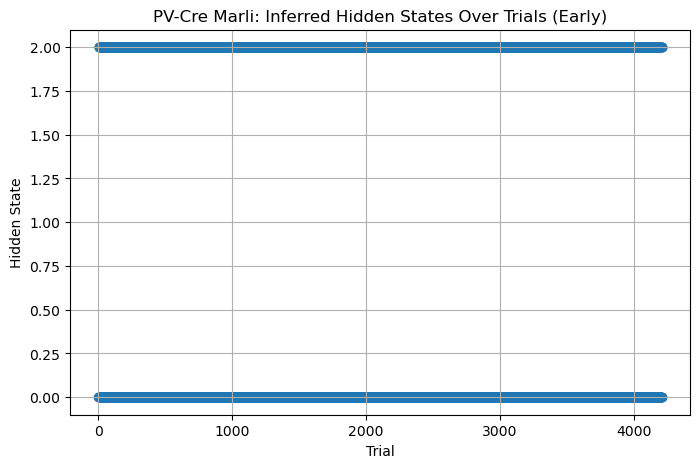

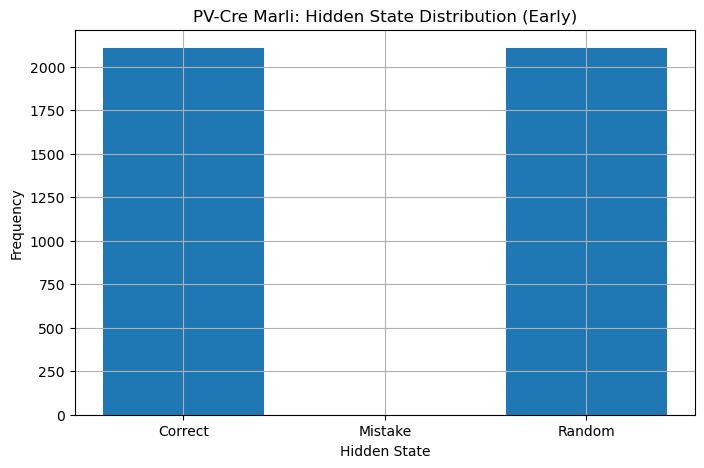

Correct Emission Probabilities: [{0: 0.9999981006692766, 1: 4.7483268086477686e-07, 2: 4.748326808645722e-07, 3: 4.748326808645722e-07, 4: 4.748326808645722e-07}]
Mistake Emission Probabilities: [{0: 1.1795517067217018e-06, 1: 0.5225472207300639, 2: 0.17930381067363596, 3: 0.1385685038602987, 4: 0.15957928518429484}]
Random Emission Probabilities: [{0: 7.947670672584939e-07, 1: 0.06357903704533267, 2: 0.3043893236624179, 3: 0.29368744054353724, 4: 0.3383434039816447}]
Transition Matrix (Hidden States Only):
State_0: [4.74832906e-07 4.02551803e-01 5.97447248e-01]
State_1: [9.98817072e-01 1.17955310e-06 1.17955310e-06]
State_2: [9.99997505e-01 7.94767699e-07 7.94767699e-07]


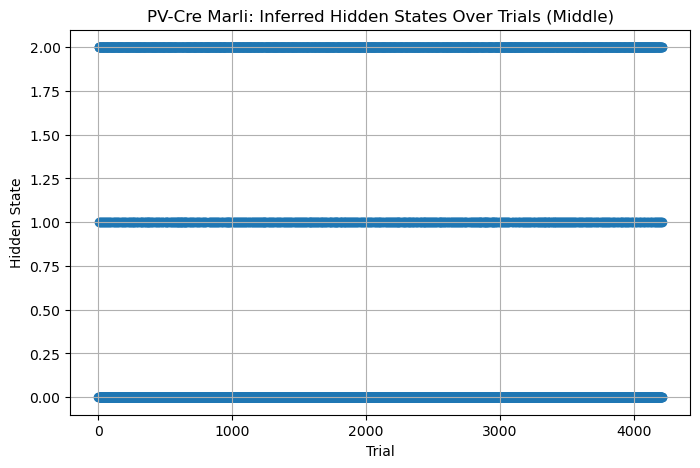

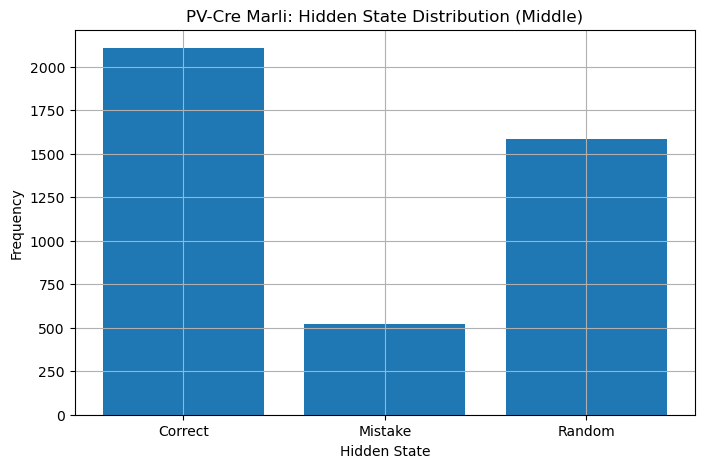

Correct Emission Probabilities: [{0: 0.9999981006692765, 1: 4.748326808796238e-07, 2: 4.748326808796238e-07, 3: 4.7483268087991705e-07, 4: 4.748326808796238e-07}]
Mistake Emission Probabilities: [{0: 1.417649068889539e-06, 1: 0.3444211202356834, 2: 0.3649614194377885, 3: 0.058432229964315206, 4: 0.232183812713144}]
Random Emission Probabilities: [{0: 7.139711543613916e-07, 1: 0.17353046559600632, 2: 0.18389091015936784, 3: 0.3646852583077901, 4: 0.2778926519656812}]
Transition Matrix (Hidden States Only):
State_0: [4.74832906e-07 3.34942000e-01 6.65057051e-01]
State_1: [9.99995476e-01 1.41765108e-06 1.41765108e-06]
State_2: [9.99284023e-01 7.13971664e-07 7.13971664e-07]


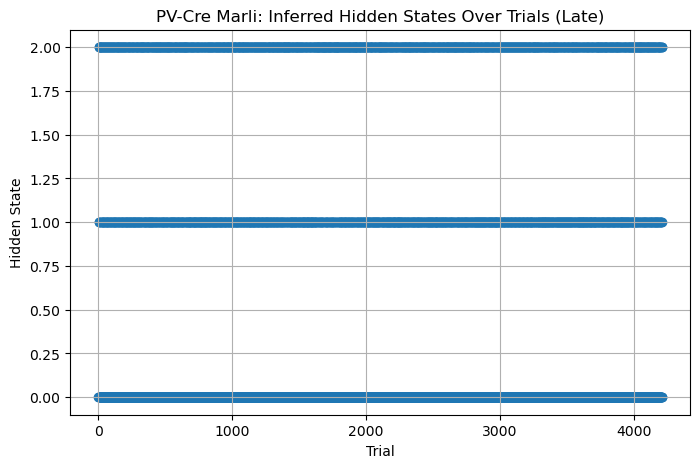

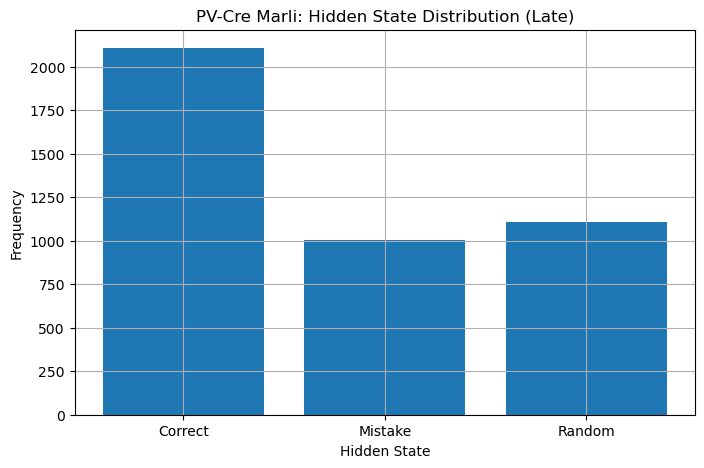

Correct Emission Probabilities: [{0: 0.9999987581515707, 1: 3.1046210732924553e-07, 2: 3.1046210732924553e-07, 3: 3.1046210732935644e-07, 4: 3.1046210732924553e-07}]
Mistake Emission Probabilities: [{0: 2.1471288307331645e-06, 1: 0.3004257569867094, 2: 0.30679277224718704, 3: 0.09448912451155675, 4: 0.29829019912571614}]
Random Emission Probabilities: [{0: 3.629406050217339e-07, 1: 0.24247417131768956, 2: 0.2475679111528217, 3: 0.2693000421985588, 4: 0.24065751239032485}]
Transition Matrix (Hidden States Only):
State_0: [3.10462204e-07 1.44592878e-01 8.55406501e-01]
State_1: [9.99992397e-01 2.14713344e-06 2.14713344e-06]
State_2: [9.99636167e-01 3.62940737e-07 3.62940737e-07]


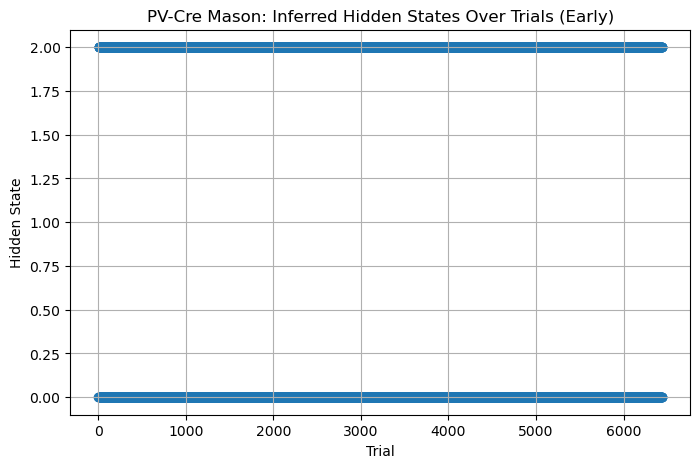

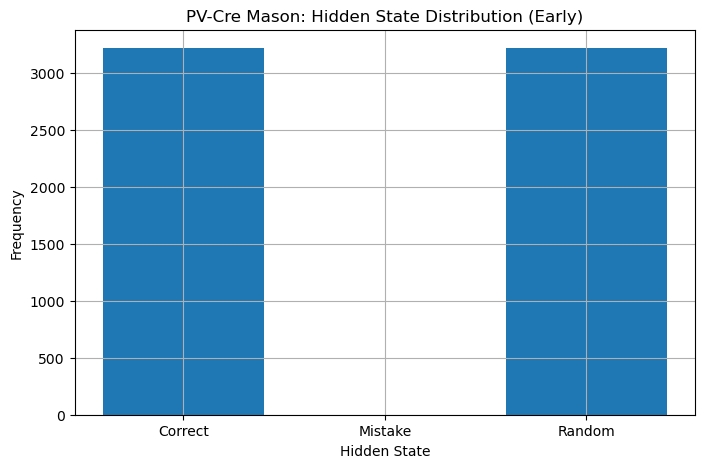

Correct Emission Probabilities: [{0: 0.9999987585369982, 1: 3.103657504817935e-07, 2: 3.103657504817935e-07, 3: 3.103657504817935e-07, 4: 3.103657504818625e-07}]
Mistake Emission Probabilities: [{0: 5.659967039099123e-07, 1: 0.3244717296906107, 2: 0.2976788450978056, 3: 0.2825178449639712, 4: 0.09533101425090844}]
Random Emission Probabilities: [{0: 6.871835583697242e-07, 1: 0.18878791483322102, 2: 0.17321463640359844, 3: 0.20536546427318006, 4: 0.432631297306442}]
Transition Matrix (Hidden States Only):
State_0: [3.10365847e-07 5.48351505e-01 4.51647875e-01]
State_1: [9.99998142e-01 5.65997024e-07 5.65997024e-07]
State_2: [9.99310949e-01 6.87184031e-07 6.87184031e-07]


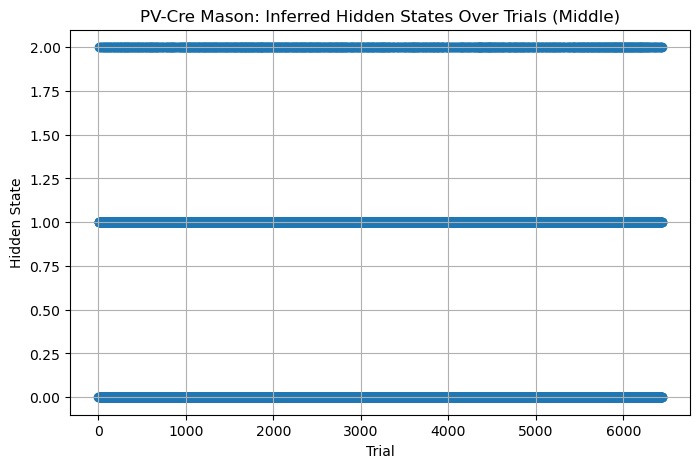

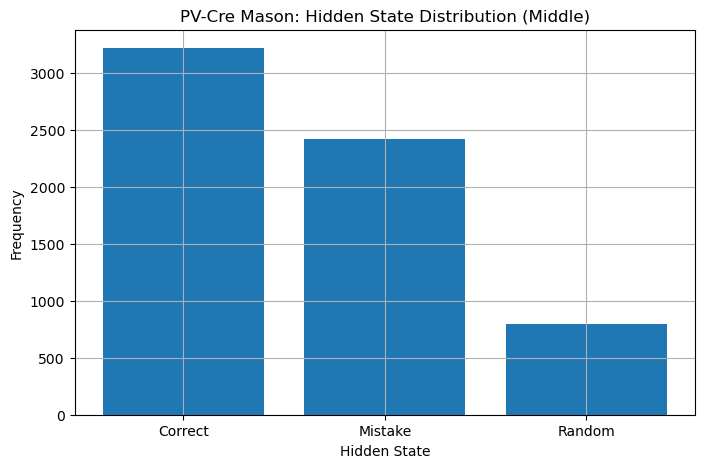

Correct Emission Probabilities: [{0: 0.9999987585369978, 1: 3.1036575054053755e-07, 2: 3.1036575054053755e-07, 3: 3.1036575054063237e-07, 4: 3.1036575054053755e-07}]
Mistake Emission Probabilities: [{0: 9.954111058665926e-07, 1: 0.3740342950724251, 2: 0.34242467829515283, 3: 0.07927048560552472, 4: 0.20426954561579144}]
Random Emission Probabilities: [{0: 4.5097863365955935e-07, 1: 0.21297167804469688, 2: 0.19482219566606426, 3: 0.314948177622586, 4: 0.27725749768801905}]
Transition Matrix (Hidden States Only):
State_0: [3.10365847e-07 3.11795407e-01 6.88203972e-01]
State_1: [9.99996679e-01 9.95412097e-07 9.95412097e-07]
State_2: [9.99547820e-01 4.50978837e-07 4.50978837e-07]


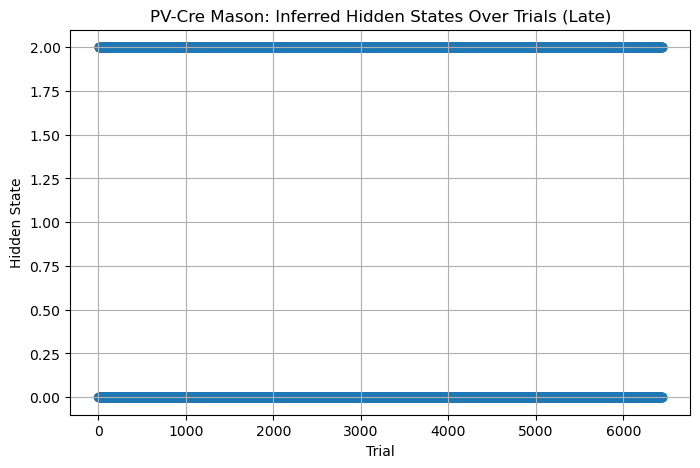

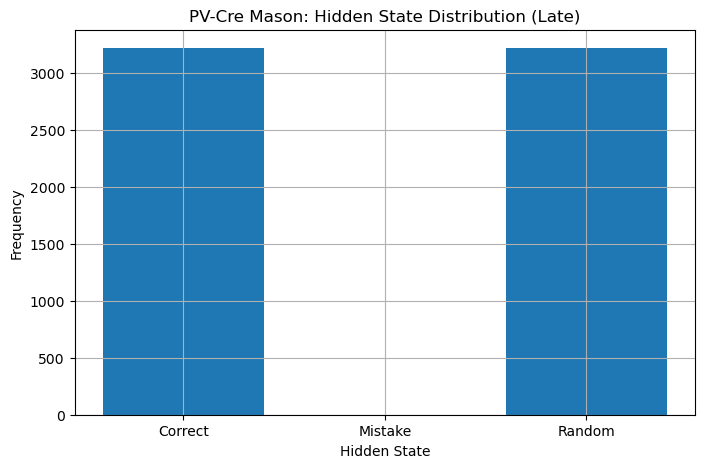

Correct Emission Probabilities: [{0: 0.999998832800069, 1: 2.917999827639948e-07, 2: 2.917999827640918e-07, 3: 2.917999827639948e-07, 4: 2.917999827639948e-07}]
Mistake Emission Probabilities: [{0: 2.0289558267819504e-06, 1: 0.2911763908568724, 2: 0.08989573581316279, 3: 0.2939877230271443, 4: 0.3249381213469937}]
Random Emission Probabilities: [{0: 3.4081471068351544e-07, 1: 0.2380561909897481, 2: 0.2558481025055779, 3: 0.24031047396836178, 4: 0.26578489172160147}]
Transition Matrix (Hidden States Only):
State_0: [2.91800068e-07 1.43816684e-01 8.56182732e-01]
State_1: [9.99992813e-01 2.02895994e-06 2.02895994e-06]
State_2: [9.99658348e-01 3.40814827e-07 3.40814827e-07]


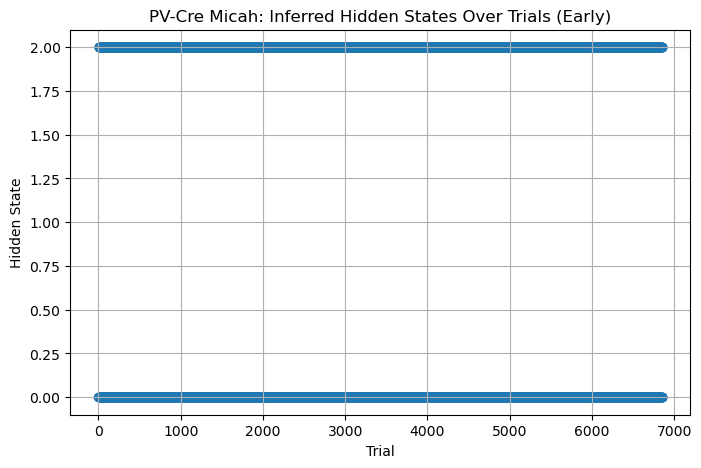

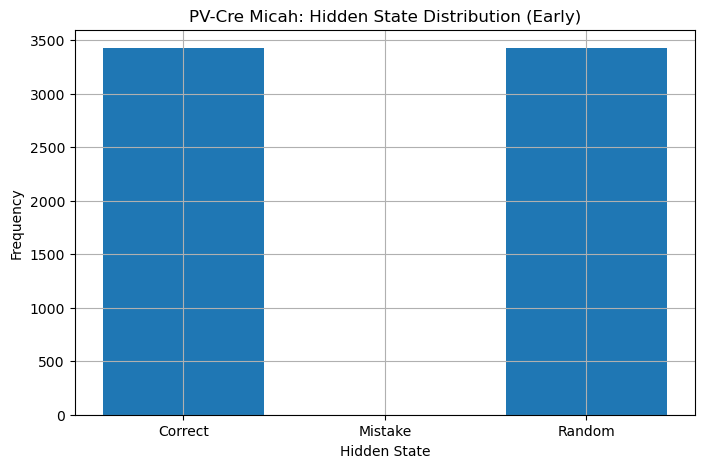

Correct Emission Probabilities: [{0: 0.9999988331405585, 1: 2.9171486038692445e-07, 2: 2.9171486038692445e-07, 3: 2.9171486038692445e-07, 4: 2.9171486038698104e-07}]
Mistake Emission Probabilities: [{0: 5.40378762525867e-07, 1: 0.3086941756436591, 2: 0.30329575587779534, 3: 0.27432014071702177, 4: 0.11368938738276123}]
Random Emission Probabilities: [{0: 6.339320434402649e-07, 1: 0.1817779877216335, 2: 0.17860203033133523, 3: 0.20181721526304333, 4: 0.43780213275194435}]
Transition Matrix (Hidden States Only):
State_0: [2.91714945e-07 5.39833049e-01 4.60166368e-01]
State_1: [9.99998189e-01 5.40379055e-07 5.40379055e-07]
State_2: [9.99364388e-01 6.33932445e-07 6.33932445e-07]


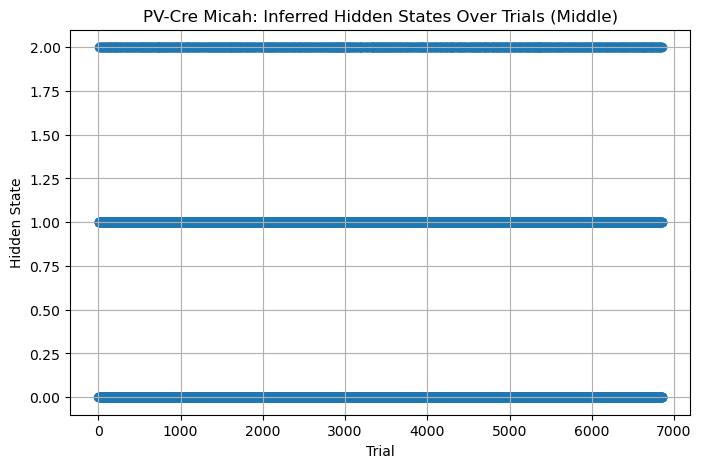

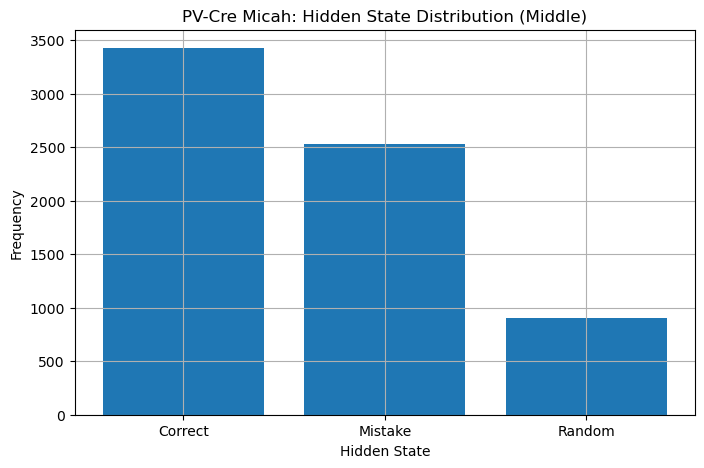

Correct Emission Probabilities: [{0: 0.9999988331405583, 1: 2.9171486045399924e-07, 2: 2.917148604540364e-07, 3: 2.917148604539992e-07, 4: 2.917148604539992e-07}]
Mistake Emission Probabilities: [{0: 1.2741022887425144e-06, 1: 0.15311999424778833, 2: 0.6674011125334234, 3: 0.10495975262712033, 4: 0.07451786648937922}]
Random Emission Probabilities: [{0: 3.7833736219716243e-07, 1: 0.27914610987910493, 2: 0.11205646365190344, 3: 0.28550193261849244, 4: 0.32329511551313694}]
Transition Matrix (Hidden States Only):
State_0: [2.91714946e-07 2.28956075e-01 7.71043342e-01]
State_1: [9.98722331e-01 1.27410391e-06 1.27410391e-06]
State_2: [9.99998789e-01 3.78337505e-07 3.78337505e-07]


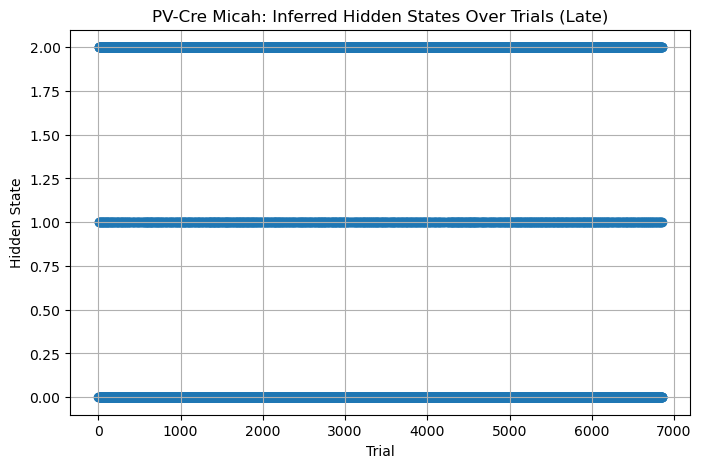

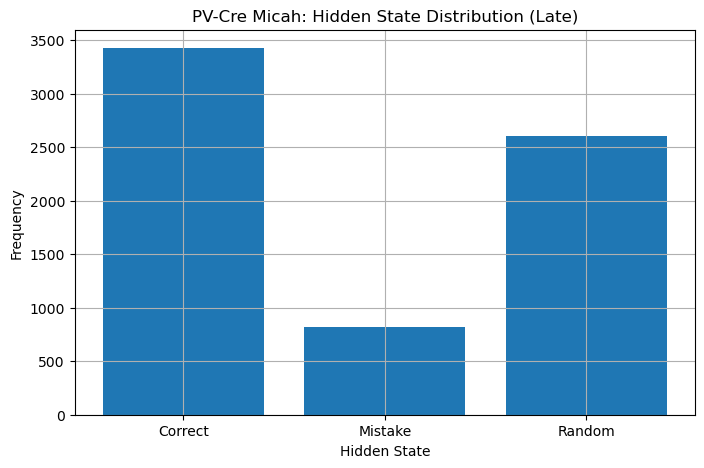

In [ ]:
pv_hmm_phase_results = {}
for curr_animal in pv_animals:
    pv_hmm_phase_results[curr_animal] = {}

for animal_name in pv_animals:
    for phase, observed_sequence in pv_animals_segment_trials_by_phases(animal_name).items():
        # Create discrete distribution for observed states (0-4: Home and outer wells)
        num_states = 3  # Number of hidden states (correct, mistake, bias)
        num_observations = 5  # Observed states: home well (0) and 4 outer wells (1-4)

        # Train the HMM using the observed sequence
        observed_sequence_reshaped = [observed_sequence]
        ### Define the best hmm based on log likelihood
        np.random.seed(747)
        best_hmm = None
        best_log_likelihood = float("-inf")

        for _ in range(5):  # Run the training multiple times
            hmm = HiddenMarkovModel(name=f"{phase} SFB")

            # Emission probabilities (phase-specific)
            if phase == "Early":
                state_dist_correct = DiscreteDistribution({0: 0.4, 1: 0.15, 2: 0.15, 3: 0.15, 4: 0.15})  # More balanced
                state_dist_mistake = DiscreteDistribution({0: 0.2, 1: 0.2, 2: 0.2, 3: 0.2, 4: 0.2})  # Uniform for mistakes
                state_dist_random = DiscreteDistribution({0: 0.1, 1: 0.225, 2: 0.225, 3: 0.225, 4: 0.225})  # Random, with outer well bias
            elif phase == "Late":
                state_dist_correct = DiscreteDistribution({0: 0.7, 1: 0.075, 2: 0.075, 3: 0.075, 4: 0.075})  # Strong home bias but less rigid
                state_dist_mistake = DiscreteDistribution({0: 0.1, 1: 0.3, 2: 0.3, 3: 0.2, 4: 0.1})  # Biased to common mistakes
                state_dist_random = DiscreteDistribution({0: 0.05, 1: 0.25, 2: 0.25, 3: 0.25, 4: 0.2})  # Random
            else:
                state_dist_correct = DiscreteDistribution({0: 0.5, 1: 0.125, 2: 0.125, 3: 0.125, 4: 0.125})  # Balanced mid-phase
                state_dist_mistake = DiscreteDistribution({0: 0.1, 1: 0.25, 2: 0.25, 3: 0.2, 4: 0.2})  # Mistake patterns
                state_dist_random = DiscreteDistribution({0: 0.1, 1: 0.225, 2: 0.225, 3: 0.225, 4: 0.225})  # Random


            # Create states
            hidden_states = [
                State(state_dist_correct, name="Correct"),
                State(state_dist_mistake, name="Mistake"),
                State(state_dist_random, name="Random")
            ]

            for state in hidden_states:
                hmm.add_state(state)

            for i in range(num_states):
                for j in range(num_states):
                    if phase == "Early":
                        prob = 1/num_states
                    elif phase == "Middle":
                        prob = 0.5 if i == j and i == 0 else 0.25
                    elif phase == "Late":
                        prob = 0.8 if i == j and i == 0 else 0.1
                    hmm.add_transition(hidden_states[i], hidden_states[j], prob)

            hmm.add_transition(hmm.start, hidden_states[0], 0.6)
            hmm.add_transition(hmm.start, hidden_states[1], 0.3)
            hmm.add_transition(hmm.start, hidden_states[2], 0.1)

            for state in hidden_states:
                hmm.add_transition(state, hmm.end, 0.1)

            hmm.bake()

            hmm.fit(observed_sequence_reshaped, 
                    algorithm="baum-welch", 
                    max_iterations=1000, 
                    stop_threshold=1e-6, 
                    pseudocount=1e-3)

            log_likelihood = hmm.log_probability(observed_sequence)
            if log_likelihood > best_log_likelihood:
                best_log_likelihood = log_likelihood
                best_hmm = hmm

        # Predict hidden states
        hidden_states_sequence = best_hmm.predict(observed_sequence)

        pv_hmm_phase_results[animal_name][phase] = {'best_hmm': best_hmm,
                                                'hidden_states_sequence': hidden_states_sequence,
                                                'transition_matrix':  best_hmm.dense_transition_matrix()}

        for state in best_hmm.states:
            if state.distribution != None:
                print(f"{state.name} Emission Probabilities: {state.distribution.parameters}")

        transition_matrix = best_hmm.dense_transition_matrix()
        print("Transition Matrix (Hidden States Only):")
        for i, row in enumerate(transition_matrix[:num_states, :num_states]):
            print(f"State_{i}:", row)

        # Plot the hidden states over time
        plt.figure(figsize=(8, 5))
        plt.scatter(range(len(hidden_states_sequence)), hidden_states_sequence)
        plt.xlabel("Trial")
        plt.ylabel("Hidden State")
        plt.title(f"PV-Cre {animal_name}: Inferred Hidden States Over Trials ({phase})")
        plt.grid()
        plt.show()

        plt.figure(figsize=(8, 5))
        plt.hist(
            hidden_states_sequence, 
            bins=np.arange(num_states + 1) - 0.5,  # Shift bins for centering
            align='mid', 
            rwidth=0.8
        )
        plt.xticks(range(num_states), ["Correct", "Mistake", "Random"])  # Custom labels
        plt.xlabel("Hidden State")
        plt.ylabel("Frequency")
        plt.title(f"PV-Cre {animal_name}: Hidden State Distribution ({phase})")
        plt.grid()
        plt.show()

Correct Emission Probabilities: [{0: 0.9999977233986242, 1: 5.691503439102175e-07, 2: 5.691503439102175e-07, 3: 5.691503439102175e-07, 4: 5.691503439108582e-07}]
Mistake Emission Probabilities: [{0: 3.288889245052637e-06, 1: 0.3150922793281251, 2: 0.31882622856071136, 3: 0.3281704130045018, 4: 0.03790779021741671}]
Random Emission Probabilities: [{0: 6.882520974893132e-07, 1: 0.23345299539360614, 2: 0.2361128679408373, 3: 0.2431047268087841, 4: 0.28732872160467493}]
Transition Matrix (Hidden States Only):
State_0: [5.69150668e-07 1.73050273e-01 8.26948589e-01]
State_1: [9.99989633e-01 3.28890006e-06 3.28890006e-06]
State_2: [9.99309787e-01 6.88252571e-07 6.88252571e-07]


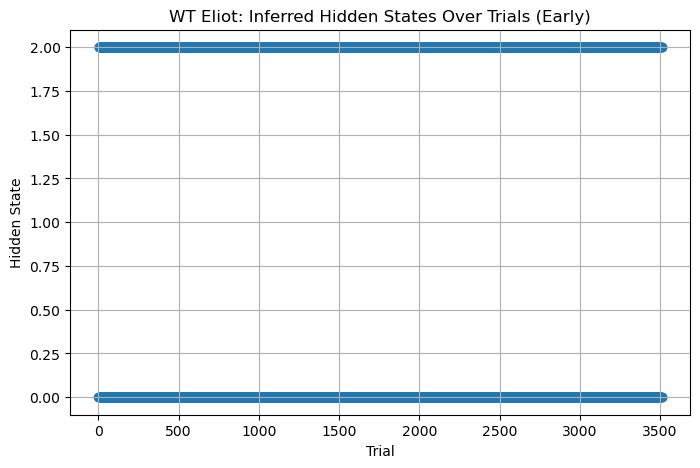

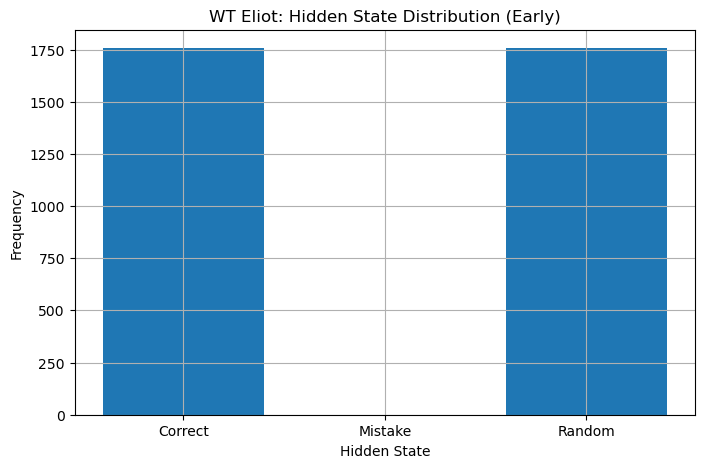

Correct Emission Probabilities: [{0: 0.9999977233986242, 1: 5.691503439099707e-07, 2: 5.691503439096705e-07, 3: 5.691503439096705e-07, 4: 5.691503439096705e-07}]
Mistake Emission Probabilities: [{0: 1.4175190692529768e-06, 1: 0.6133026081910111, 2: 0.14434839270491293, 3: 0.11190408847524144, 4: 0.13044349310976522}]
Random Emission Probabilities: [{0: 9.50975213403401e-07, 1: 0.08686477782698476, 2: 0.29496425642954116, 3: 0.2853480807912554, 4: 0.33282193397700516}]
Transition Matrix (Hidden States Only):
State_0: [5.69150668e-07 4.01509548e-01 5.98489314e-01]
State_1: [9.98578460e-01 1.41752108e-06 1.41752108e-06]
State_2: [9.99996990e-01 9.50976118e-07 9.50976118e-07]


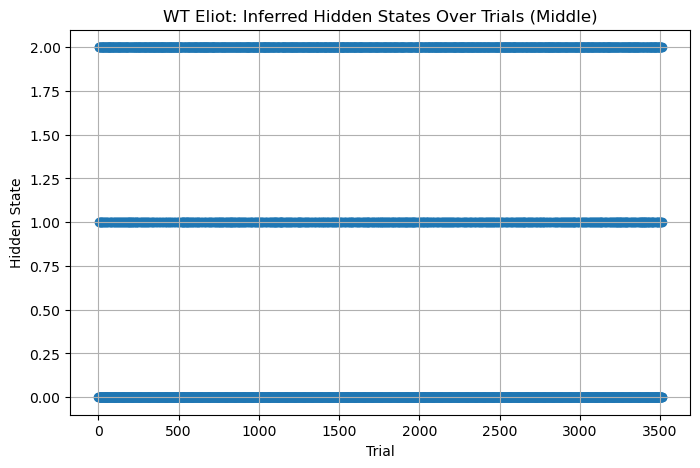

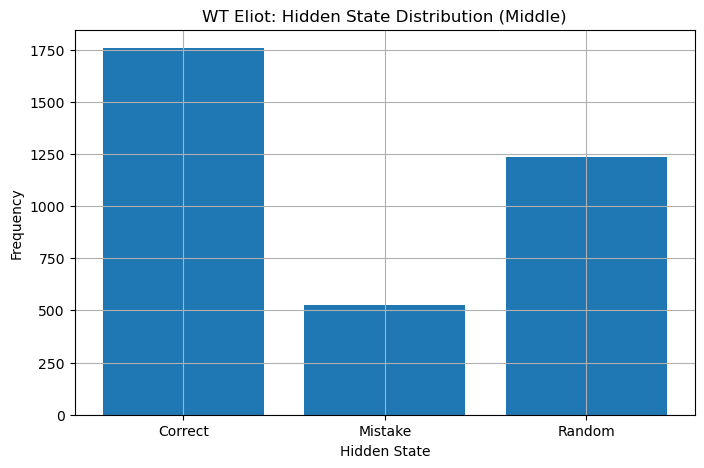

Correct Emission Probabilities: [{0: 0.9999977233986242, 1: 5.691503439097465e-07, 2: 5.691503439097465e-07, 3: 5.691503439102443e-07, 4: 5.691503439097465e-07}]
Mistake Emission Probabilities: [{0: 1.5605092227299113e-06, 1: 0.37613563495536284, 2: 0.3594684068278492, 3: 0.03632563137420722, 4: 0.22806876633335804}]
Random Emission Probabilities: [{0: 8.95901979833536e-07, 1: 0.18542312422471416, 2: 0.17707388592758097, 3: 0.36976019263891924, 4: 0.26774190130680575}]
Transition Matrix (Hidden States Only):
State_0: [5.69150668e-07 3.64718841e-01 6.35280021e-01]
State_1: [9.99995148e-01 1.56051166e-06 1.56051166e-06]
State_2: [9.99101507e-01 8.95902782e-07 8.95902782e-07]


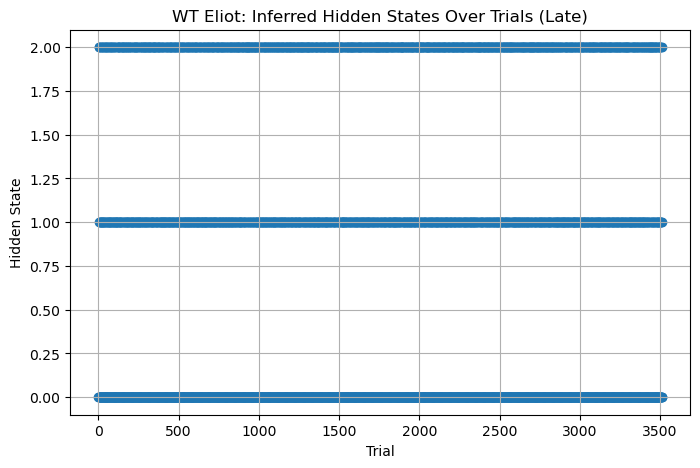

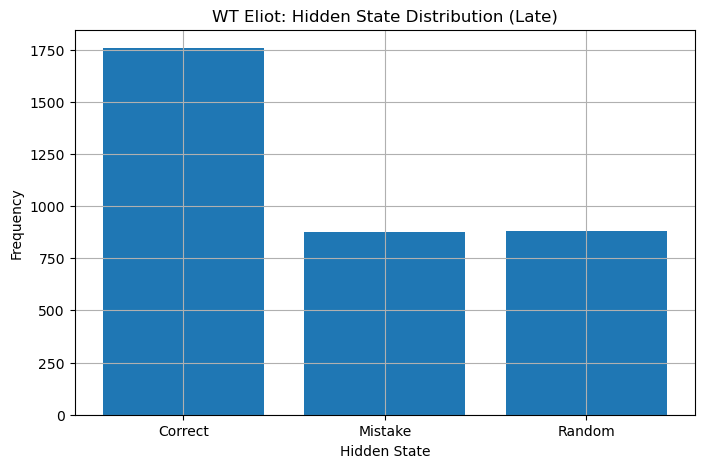

Correct Emission Probabilities: [{0: 0.9999984484126289, 1: 3.878968427885094e-07, 2: 3.878968427885094e-07, 3: 3.87896842788725e-07, 4: 3.878968427885094e-07}]
Mistake Emission Probabilities: [{0: 2.5502466346099024e-06, 1: 0.3192834679782709, 2: 0.25877645144374645, 3: 0.06864815797864726, 4: 0.3532893723527009}]
Random Emission Probabilities: [{0: 4.57479339780937e-07, 1: 0.25015194726193973, 2: 0.20244872236165973, 3: 0.27040860696701213, 4: 0.27699026593004866}]
Transition Matrix (Hidden States Only):
State_0: [3.87896993e-07 1.52100205e-01 8.47899019e-01]
State_1: [9.99991480e-01 2.55025314e-06 2.55025314e-06]
State_2: [9.99541304e-01 4.57479549e-07 4.57479549e-07]


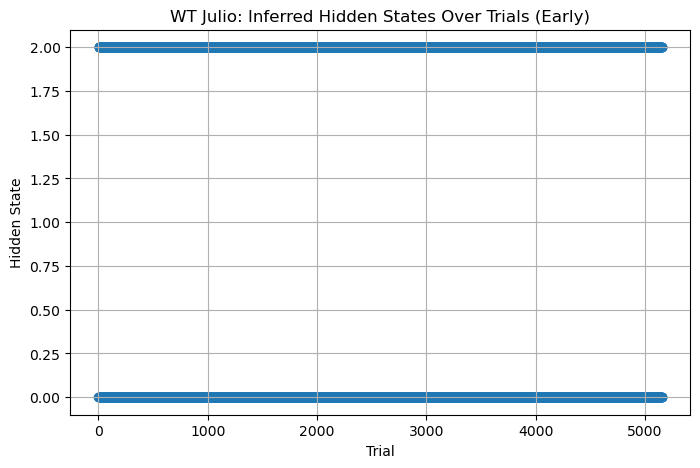

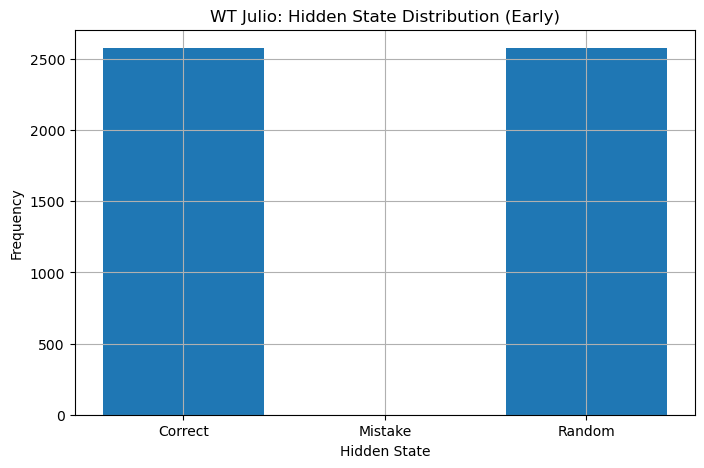

Correct Emission Probabilities: [{0: 0.9999984484126291, 1: 3.8789684272538727e-07, 2: 3.8789684272551226e-07, 3: 3.8789684272538727e-07, 4: 3.8789684272538727e-07}]
Mistake Emission Probabilities: [{0: 9.076921773895674e-07, 1: 0.21641759348055942, 2: 0.4665294208871292, 3: 0.1551901543411623, 4: 0.16186192359897167}]
Random Emission Probabilities: [{0: 6.77362249778599e-07, 1: 0.3275559941565186, 2: 0.07317465497925599, 3: 0.2933180202450562, 4: 0.30595065325691945}]
Transition Matrix (Hidden States Only):
State_0: [3.87896993e-07 4.27342655e-01 5.72656569e-01]
State_1: [9.99089753e-01 9.07693001e-07 9.07693001e-07]
State_2: [9.99997842e-01 6.77362709e-07 6.77362709e-07]


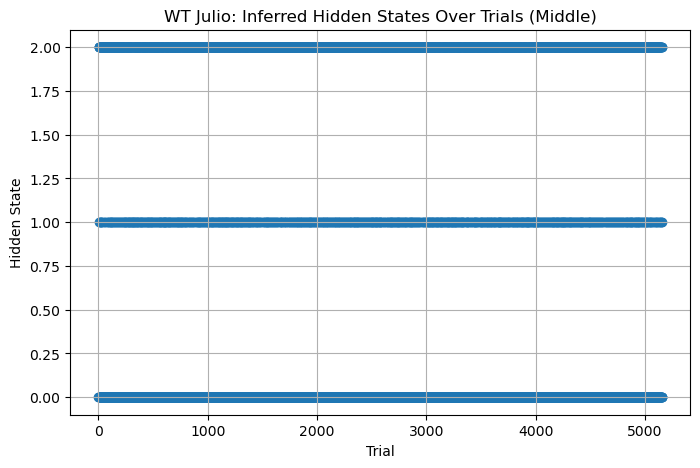

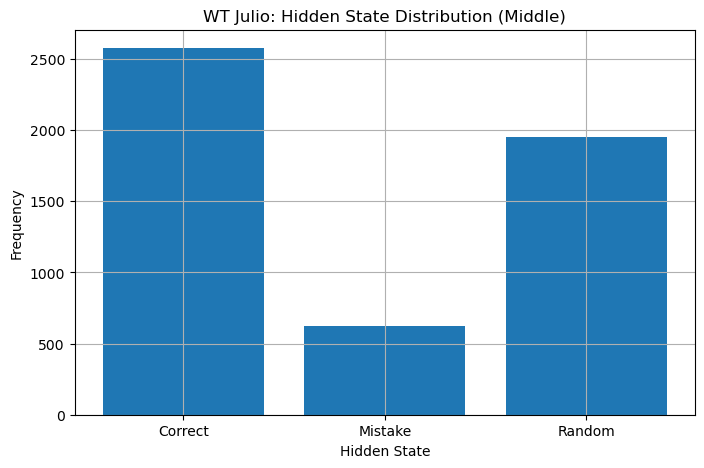

Correct Emission Probabilities: [{0: 0.9999984490142515, 1: 3.87746437129289e-07, 2: 3.877464371293667e-07, 3: 3.87746437129289e-07, 4: 3.87746437129289e-07}]
Mistake Emission Probabilities: [{0: 1.8477274861524683e-06, 1: 0.12157637533992707, 2: 0.7504218848945737, 3: 0.07272667298529832, 4: 0.05527321905271467}]
Random Emission Probabilities: [{0: 4.907241721588724e-07, 1: 0.30778426929056174, 2: 0.08630349400994564, 3: 0.27413910131763375, 4: 0.3317726446576866}]
Transition Matrix (Hidden States Only):
State_0: [3.87746587e-07 2.09848976e-01 7.90150248e-01]
State_1: [9.98146966e-01 1.84773090e-06 1.84773090e-06]
State_2: [9.99998464e-01 4.90724413e-07 4.90724413e-07]


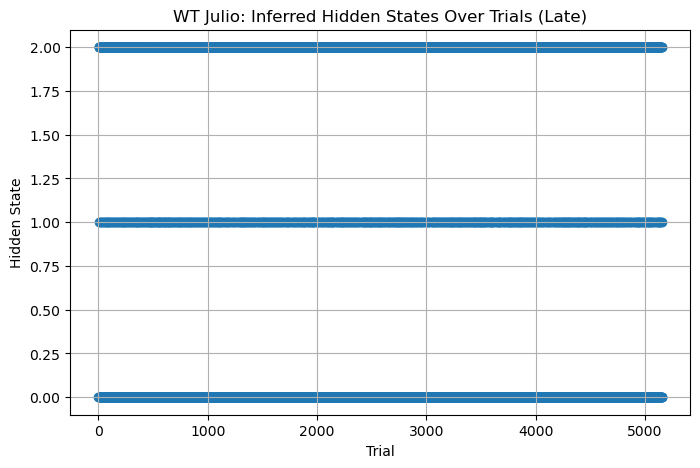

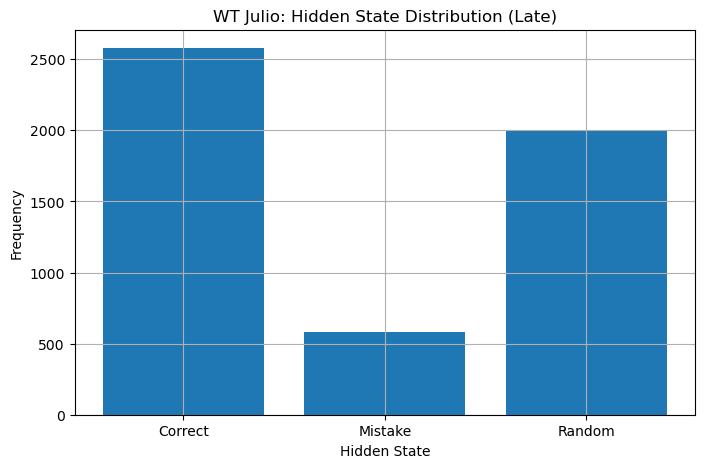

Correct Emission Probabilities: [{0: 0.9999985190697533, 1: 3.702325616645494e-07, 2: 3.702325616645494e-07, 3: 3.7023256166471485e-07, 4: 3.702325616645494e-07}]
Mistake Emission Probabilities: [{0: 2.5110859641221115e-06, 1: 0.27106273520693497, 2: 0.3279758858950988, 3: 0.10440230911314047, 4: 0.2965565586988618}]
Random Emission Probabilities: [{0: 4.3425849213972275e-07, 1: 0.20977098858291152, 2: 0.254210937326941, 3: 0.30633698905602685, 4: 0.22968065077562838}]
Transition Matrix (Hidden States Only):
State_0: [3.70232699e-07 1.47437796e-01 8.52561464e-01]
State_1: [9.99991167e-01 2.51109227e-06 2.51109227e-06]
State_2: [9.99564663e-01 4.34258681e-07 4.34258681e-07]


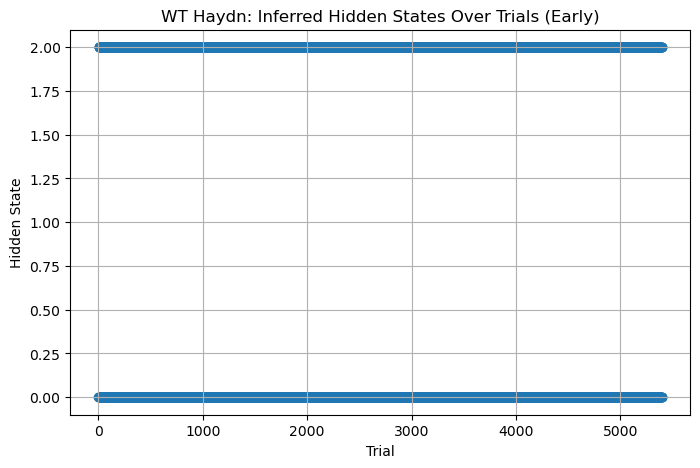

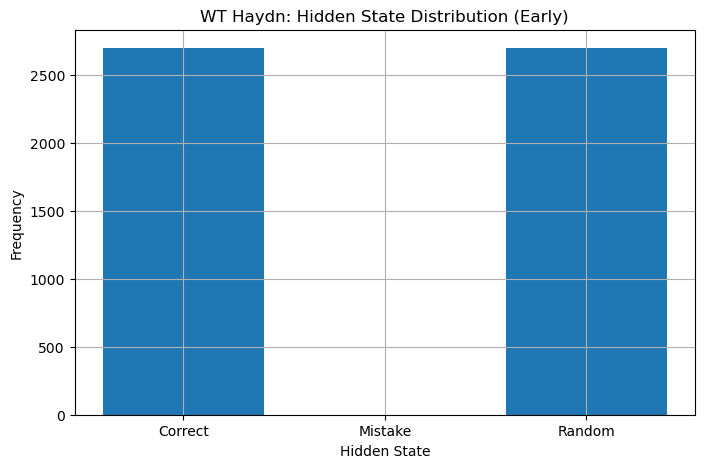

Correct Emission Probabilities: [{0: 0.9999985190697537, 1: 3.702325615933622e-07, 2: 3.702325615933622e-07, 3: 3.702325615933622e-07, 4: 3.702325615934672e-07}]
Mistake Emission Probabilities: [{0: 6.680612810897178e-07, 1: 0.30605981728143894, 2: 0.29856849611022845, 3: 0.29482932779973303, 4: 0.10054169074731835}]
Random Emission Probabilities: [{0: 8.304672994209665e-07, 1: 0.16266416886382387, 2: 0.15868915702008582, 3: 0.19572554361927, 4: 0.4829203000295207}]
Transition Matrix (Hidden States Only):
State_0: [3.70232699e-07 5.54188246e-01 4.45811014e-01]
State_1: [9.99997820e-01 6.68061727e-07 6.68061727e-07]
State_2: [9.99167259e-01 8.30467989e-07 8.30467989e-07]


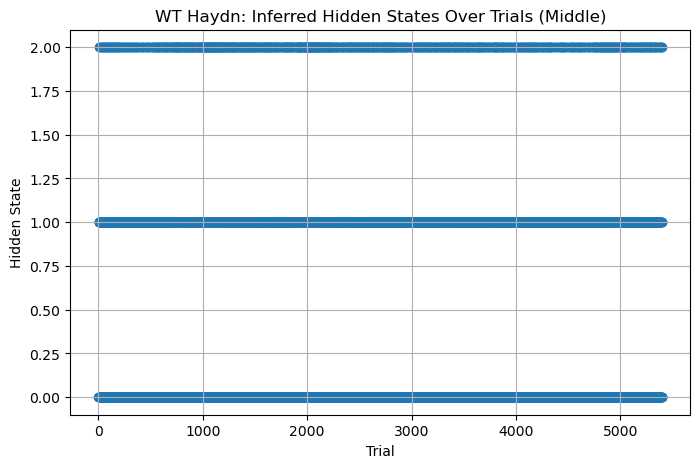

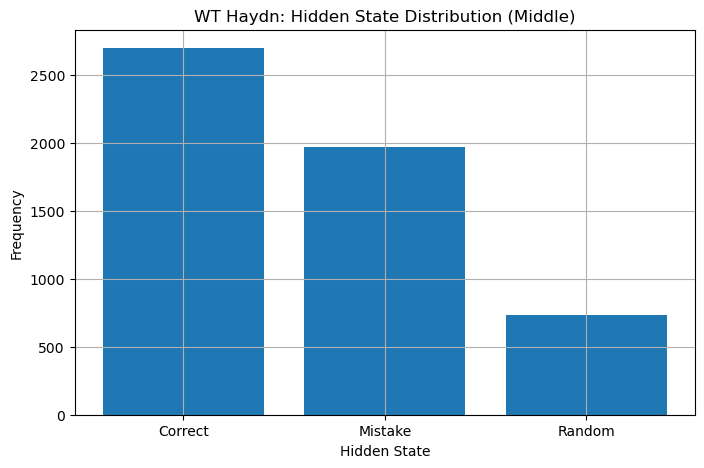

Correct Emission Probabilities: [{0: 0.9999985190697532, 1: 3.702325616907761e-07, 2: 3.702325616907084e-07, 3: 3.702325616907084e-07, 4: 3.702325616907084e-07}]
Mistake Emission Probabilities: [{0: 1.697615471935098e-06, 1: 0.7491620114003643, 2: 0.10906782269421847, 3: 0.08944085713447626, 4: 0.052327611155469064}]
Random Emission Probabilities: [{0: 4.7349640567322934e-07, 1: 0.10876187091713053, 2: 0.26504166767358295, 3: 0.3244945822123008, 4: 0.30170140570057996}]
Transition Matrix (Hidden States Only):
State_0: [3.70232699e-07 2.18088366e-01 7.81910893e-01]
State_1: [9.98297577e-01 1.69761835e-06 1.69761835e-06]
State_2: [9.99998499e-01 4.73496630e-07 4.73496630e-07]


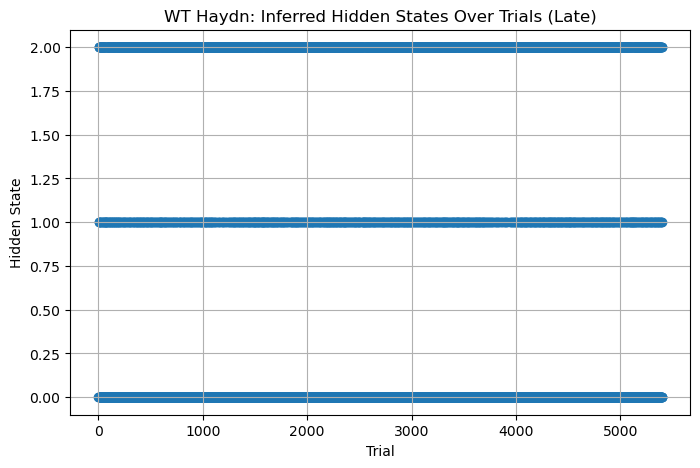

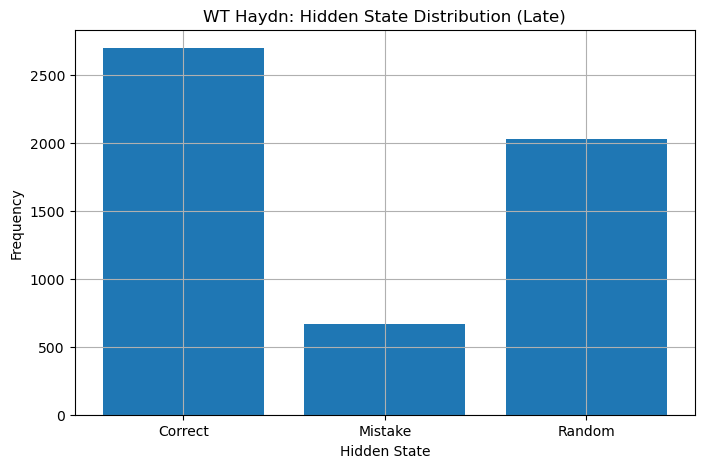

In [ ]:
wt_hmm_phase_results = {}
for curr_animal in ['Eliot', 'Julio', 'Haydn']:
    wt_hmm_phase_results[curr_animal] = {}

for animal_name in ['Eliot', 'Julio', 'Haydn']:
    for phase, observed_sequence in wt_animals_segment_trials_by_phases(animal_name).items():
        # Create discrete distribution for observed states (0-4: Home and outer wells)
        num_states = 3  # Number of hidden states (correct, mistake, bias)
        num_observations = 5  # Observed states: home well (0) and 4 outer wells (1-4)

        # Train the HMM using the observed sequence
        observed_sequence_reshaped = [observed_sequence]
        ### Define the best hmm based on log likelihood
        np.random.seed(747)
        best_hmm = None
        best_log_likelihood = float("-inf")

        for _ in range(5):  # Run the training multiple times
            hmm = HiddenMarkovModel(name=f"{phase} SFB")

            # Emission probabilities (phase-specific)
            if phase == "Early":
                state_dist_correct = DiscreteDistribution({0: 0.4, 1: 0.15, 2: 0.15, 3: 0.15, 4: 0.15})  # More balanced
                state_dist_mistake = DiscreteDistribution({0: 0.2, 1: 0.2, 2: 0.2, 3: 0.2, 4: 0.2})  # Uniform for mistakes
                state_dist_random = DiscreteDistribution({0: 0.1, 1: 0.225, 2: 0.225, 3: 0.225, 4: 0.225})  # Random, with outer well bias
            elif phase == "Late":
                state_dist_correct = DiscreteDistribution({0: 0.7, 1: 0.075, 2: 0.075, 3: 0.075, 4: 0.075})  # Strong home bias but less rigid
                state_dist_mistake = DiscreteDistribution({0: 0.1, 1: 0.3, 2: 0.3, 3: 0.2, 4: 0.1})  # Biased to common mistakes
                state_dist_random = DiscreteDistribution({0: 0.05, 1: 0.25, 2: 0.25, 3: 0.25, 4: 0.2})  # Random
            else:
                state_dist_correct = DiscreteDistribution({0: 0.5, 1: 0.125, 2: 0.125, 3: 0.125, 4: 0.125})  # Balanced mid-phase
                state_dist_mistake = DiscreteDistribution({0: 0.1, 1: 0.25, 2: 0.25, 3: 0.2, 4: 0.2})  # Mistake patterns
                state_dist_random = DiscreteDistribution({0: 0.1, 1: 0.225, 2: 0.225, 3: 0.225, 4: 0.225})  # Random


            # Create states
            hidden_states = [
                State(state_dist_correct, name="Correct"),
                State(state_dist_mistake, name="Mistake"),
                State(state_dist_random, name="Random")
            ]

            for state in hidden_states:
                hmm.add_state(state)

            for i in range(num_states):
                for j in range(num_states):
                    if phase == "Early":
                        prob = 1/num_states
                    elif phase == "Middle":
                        prob = 0.5 if i == j and i == 0 else 0.25
                    elif phase == "Late":
                        prob = 0.9 if i == j and i == 0 else 0.1
                    hmm.add_transition(hidden_states[i], hidden_states[j], prob)

            hmm.add_transition(hmm.start, hidden_states[0], 0.6)
            hmm.add_transition(hmm.start, hidden_states[1], 0.3)
            hmm.add_transition(hmm.start, hidden_states[2], 0.1)

            for state in hidden_states:
                hmm.add_transition(state, hmm.end, 0.1)

            hmm.bake()

            hmm.fit(observed_sequence_reshaped, 
                    algorithm="baum-welch", 
                    max_iterations=1000, 
                    stop_threshold=1e-6, 
                    pseudocount=1e-3)

            log_likelihood = hmm.log_probability(observed_sequence)
            if log_likelihood > best_log_likelihood:
                best_log_likelihood = log_likelihood
                best_hmm = hmm

        # Predict hidden states
        hidden_states_sequence = best_hmm.predict(observed_sequence)

        wt_hmm_phase_results[animal_name][phase] = {'best_hmm': best_hmm,
                                                'hidden_states_sequence': hidden_states_sequence,
                                                'transition_matrix':  best_hmm.dense_transition_matrix()}

        for state in best_hmm.states:
            if state.distribution != None:
                print(f"{state.name} Emission Probabilities: {state.distribution.parameters}")

        transition_matrix = best_hmm.dense_transition_matrix()
        print("Transition Matrix (Hidden States Only):")
        for i, row in enumerate(transition_matrix[:num_states, :num_states]):
            print(f"State_{i}:", row)

        # Plot the hidden states over time
        plt.figure(figsize=(8, 5))
        plt.scatter(range(len(hidden_states_sequence)), hidden_states_sequence)
        plt.xlabel("Trial")
        plt.ylabel("Hidden State")
        plt.title(f"WT {animal_name}: Inferred Hidden States Over Trials ({phase})")
        plt.grid()
        plt.show()

        plt.figure(figsize=(8, 5))
        plt.hist(
            hidden_states_sequence, 
            bins=np.arange(num_states + 1) - 0.5,  # Shift bins for centering
            align='mid', 
            rwidth=0.8
        )
        plt.xticks(range(num_states), ["Correct", "Mistake", "Random"])  # Custom labels
        plt.xlabel("Hidden State")
        plt.ylabel("Frequency")
        plt.title(f"WT {animal_name}: Hidden State Distribution ({phase})")
        plt.grid()
        plt.show()

### HMM w/o Home Well

In [179]:
def pv_animals_segment_trials_by_phases_no_home(animal_name):
    # Extract trials and dates from the animal's data
    trials = pv_animal_data[animal_name]['trials']
    dates = pv_animal_data[animal_name]['date']

    # Determine the cutoff date for sequence switching
    cutoff_date = "20241110"  # Ensure YYYYMMDD format for proper comparison
    
    # Determine if we need to filter based on sequence switching
    if animal_name in ["Micah", "Mason"]:
        # Filter out trials beyond the cutoff date
        valid_indices = [i for i, date in enumerate(dates) if int(date) <= int(cutoff_date)]
    else:  # 'Marli' and others have no cutoff
        valid_indices = list(range(len(trials)))
    
    # Extract valid trials
    valid_trials = [trials[i] for i in valid_indices]
    
    # Concatenate all valid trials into a single list of trials
    all_trials = []
    for sess in valid_trials:
        sess = sess[:-1]  # Exclude the last trial if it's a throwaway
        for trial in sess:
            all_trials.append(trial)
    
    # Compute the total number of trials and determine split points
    num_trials = len(all_trials)
    split_early = num_trials // 3
    split_mid = 2 * num_trials // 3

    # Split into early, mid, and late phases
    early_trials = all_trials[:split_early]
    mid_trials = all_trials[split_early:split_mid]
    late_trials = all_trials[split_mid:]
    
    # Convert trials back into sequences with interleaved home/outer well visits
    def convert_to_sequence(trials):
        sequence = []
        for trial in trials:
            sequence.append(trial[3])  # Outer well
        return np.array(sequence)

    early_phase = convert_to_sequence(early_trials)
    mid_phase = convert_to_sequence(mid_trials)
    late_phase = convert_to_sequence(late_trials)

    phase_dictionary = {
        "Early": early_phase.astype(int),
        "Middle": mid_phase.astype(int),
        "Late": late_phase.astype(int),
    }

    return phase_dictionary

# Example usage:
animal_name = "Micah"  # Replace with the current animal's name
phase_dictionary = pv_animals_segment_trials_by_phases_no_home(animal_name)

# Verify the results
print(f"Early Phase: {len(phase_dictionary['Early'])} trials")  # Divide by 2 to get trial count
print(f"Mid Phase: {len(phase_dictionary['Middle'])} trials")  # Divide by 2 to get trial count
print(f"Late Phase: {len(phase_dictionary['Late'])} trials")  # Divide by 2 to get trial count

Early Phase: 3427 trials
Mid Phase: 3428 trials
Late Phase: 3428 trials


In [180]:
wt_end_dates = {
    "Eliot": "20221027",
    "Julio": "20230815",
    "Haydn": "20230530",
}
def wt_animals_segment_trials_by_phases_no_home(animal_name):
    # Extract trials and dates from the animal's data
    trials = wt_animal_data[animal_name]['trials']
    dates = wt_animal_data[animal_name]['date']

    # Determine the cutoff date for sequence switching
    cutoff_date = wt_end_dates[animal_name] # Ensure YYYYMMDD format for proper comparison
    
    # Filter out trials beyond the cutoff date
    valid_indices = [i for i, date in enumerate(dates) if int(date) <= int(cutoff_date)]
    
    # Extract valid trials
    valid_trials = [trials[i] for i in valid_indices]
    
    # Concatenate all valid trials into a single list of trials
    all_trials = []
    for sess in valid_trials:
        sess = sess[:-1]  # Exclude the last trial if it's a throwaway
        for trial in sess:
            all_trials.append(trial)
    
    # Compute the total number of trials and determine split points
    num_trials = len(all_trials)
    split_early = num_trials // 3
    split_mid = 2 * num_trials // 3

    # Split into early, mid, and late phases
    early_trials = all_trials[:split_early]
    mid_trials = all_trials[split_early:split_mid]
    late_trials = all_trials[split_mid:]
    
    # Convert trials back into sequences with interleaved home/outer well visits
    def convert_to_sequence(trials):
        sequence = []
        for trial in trials:
            sequence.append(trial[3])  # Outer well
        return np.array(sequence)

    early_phase = convert_to_sequence(early_trials)
    mid_phase = convert_to_sequence(mid_trials)
    late_phase = convert_to_sequence(late_trials)

    phase_dictionary = {
        "Early": early_phase.astype(int),
        "Middle": mid_phase.astype(int),
        "Late": late_phase.astype(int),
    }

    return phase_dictionary

# Example usage:
animal_name = "Eliot"  # Replace with the current animal's name
phase_dictionary = wt_animals_segment_trials_by_phases_no_home(animal_name)

# Verify the results
print(f"Early Phase: {len(phase_dictionary['Early'])} trials")  # Divide by 2 to get trial count
print(f"Mid Phase: {len(phase_dictionary['Middle'])} trials")  # Divide by 2 to get trial count
print(f"Late Phase: {len(phase_dictionary['Late'])} trials")  # Divide by 2 to get trial count

Early Phase: 1757 trials
Mid Phase: 1757 trials
Late Phase: 1757 trials


Correct Emission Probabilities: [{1: 0.5143543813160321, 2: 0.48564365770342877, 3: 1.1518942683927322e-06, 4: 8.09086270710777e-07}]
Mistake Emission Probabilities: [{1: 2.61903393354138e-06, 2: 2.2808934699483165e-06, 3: 0.9936749315281008, 4: 0.006320168544495703}]
Random Emission Probabilities: [{1: 1.8564179201321074e-06, 2: 1.6361896765752698e-06, 3: 2.7775876173977115e-05, 4: 0.9999687315162293}]
Transition Matrix (Hidden States Only):
State_0: [0.10445776 0.44637828 0.44855247]
State_1: [0.76109407 0.00472532 0.23417944]
State_2: [8.70910382e-01 1.29057701e-01 3.08475206e-05]


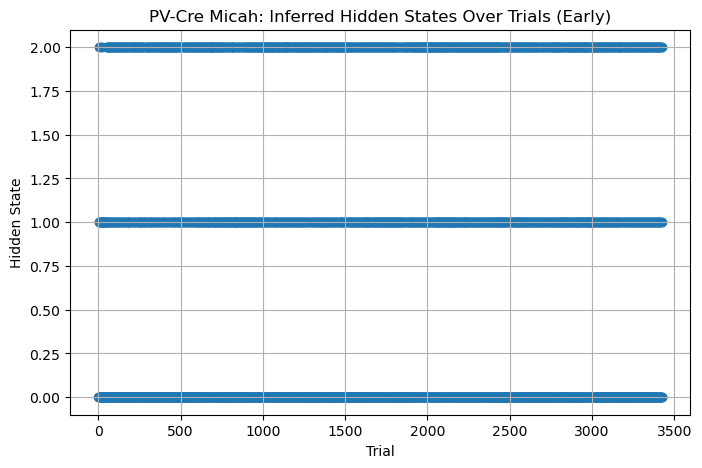

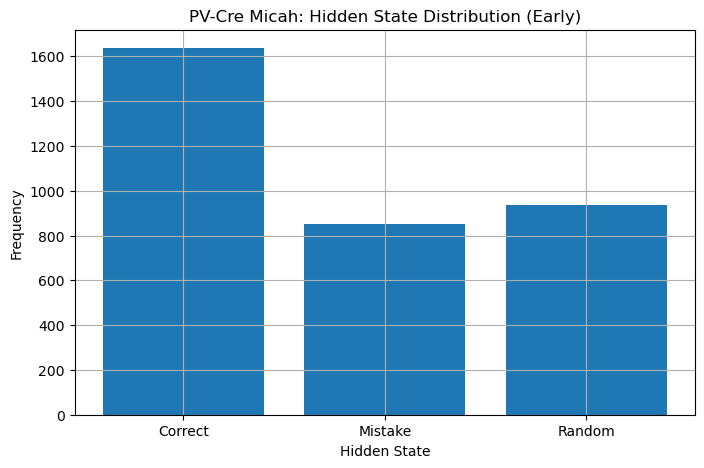

Correct Emission Probabilities: [{1: 0.0564050542403693, 2: 0.4432654202750649, 3: 0.022982061526783497, 4: 0.4773474639577823}]
Mistake Emission Probabilities: [{1: 9.97649231523564e-07, 2: 8.4388601137387e-06, 3: 0.544449691600125, 4: 0.4555408718905299}]
Random Emission Probabilities: [{1: 0.5652938651198597, 2: 0.4346990915650142, 3: 1.9079937785697134e-06, 4: 5.135321347712861e-06}]
Transition Matrix (Hidden States Only):
State_0: [2.28604937e-01 2.51641215e-05 7.71367651e-01]
State_1: [0.23594265 0.08205275 0.6813363 ]
State_2: [7.94820831e-06 9.33288696e-01 6.67026762e-02]


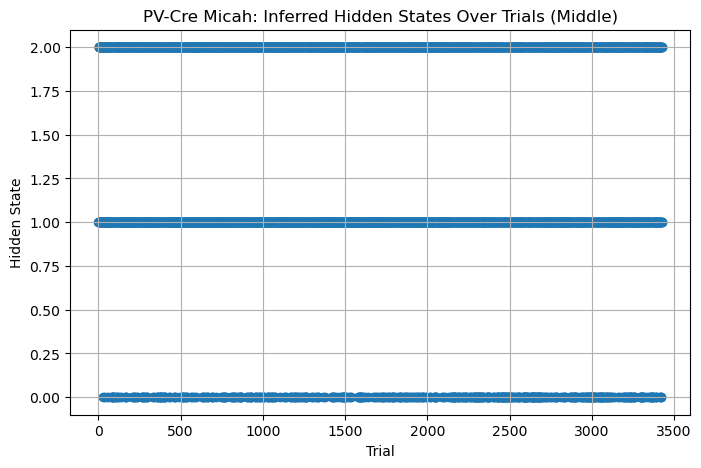

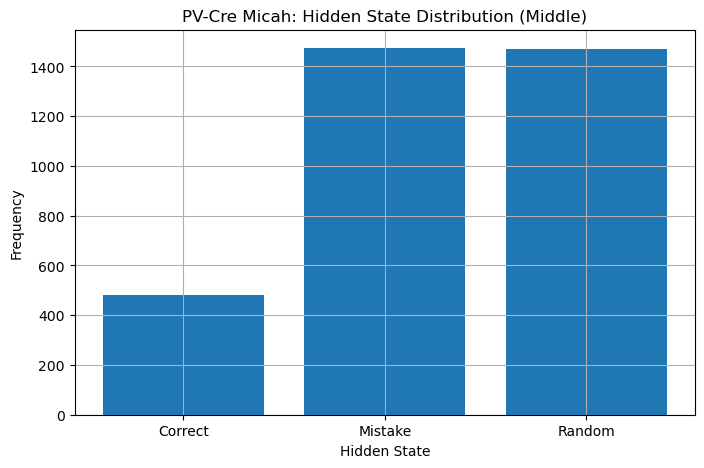

Correct Emission Probabilities: [{1: 0.459746579626398, 2: 5.117555609852881e-06, 3: 6.546113915826479e-06, 4: 0.5402417567040763}]
Mistake Emission Probabilities: [{1: 0.002080648973345475, 2: 0.49383945234703763, 3: 0.5040773337995202, 4: 2.5648800965819434e-06}]
Random Emission Probabilities: [{1: 0.4922422203406787, 2: 1.3533713788802633e-06, 3: 1.170026538866503e-06, 4: 0.5077552562614035}]
Transition Matrix (Hidden States Only):
State_0: [0.01390659 0.01654447 0.96954685]
State_1: [0.28357682 0.24496874 0.4708516 ]
State_2: [1.05006503e-05 9.64932272e-01 3.50564526e-02]


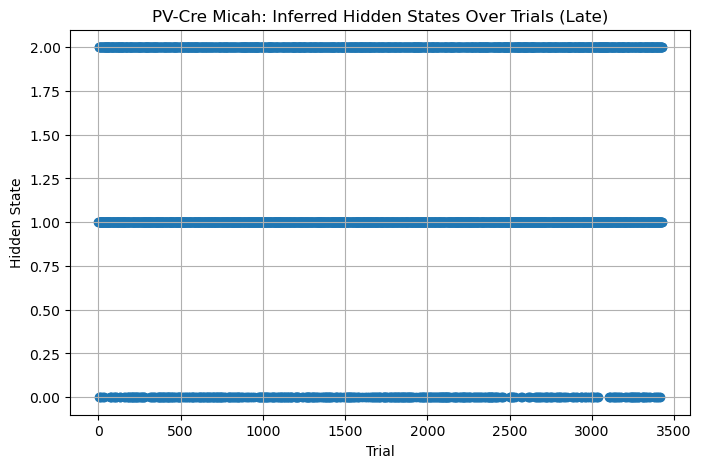

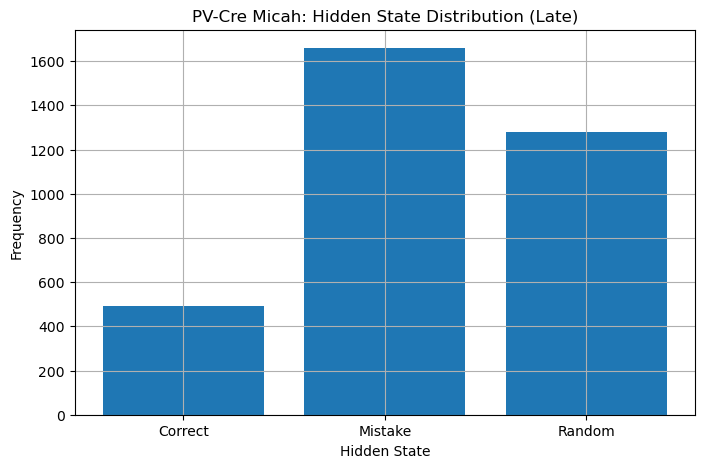

In [184]:
pv_hmm_phase_results = {}
for curr_animal in pv_animals:
    pv_hmm_phase_results[curr_animal] = {}
animal_name = 'Micah'
for phase, observed_sequence in pv_animals_segment_trials_by_phases_no_home(animal_name).items():
    # Create discrete distribution for observed states (0-4: Home and outer wells)
    num_states = 3  # Number of hidden states (correct, mistake, bias)
    num_observations = 4  # Observed states: home well (0) and 4 outer wells (1-4)

    # Train the HMM using the observed sequence
    observed_sequence_reshaped = [observed_sequence]
    ### Define the best hmm based on log likelihood
    np.random.seed(747)
    best_hmm = None
    best_log_likelihood = float("-inf")

    for _ in range(5):  # Run the training multiple times
        hmm = HiddenMarkovModel(name=f"{phase} SFB")

        state_dist_correct = DiscreteDistribution({1: 0.25, 2: 0.25, 3: 0.25, 4: 0.25})  # More balanced
        state_dist_mistake = DiscreteDistribution({1: 0.25, 2: 0.25, 3: 0.25, 4: 0.25})  # Uniform for mistakes
        state_dist_random = DiscreteDistribution({1: 0.25, 2: 0.25, 3: 0.25, 4: 0.25})  # Random, with outer well bias
        
        # # Emission probabilities (phase-specific)
        # if phase == "Early":
        #     state_dist_correct = DiscreteDistribution({0: 0.25, 1: 0.25, 2: 0.25, 3: 0.25})  # More balanced
        #     state_dist_mistake = DiscreteDistribution({0: 0.25, 1: 0.25, 2: 0.25, 3: 0.25})  # Uniform for mistakes
        #     state_dist_random = DiscreteDistribution({0: 0.25, 1: 0.25, 2: 0.25, 3: 0.25})  # Random, with outer well bias
        # elif phase == "Late":
        #     state_dist_correct = DiscreteDistribution({0: 0.7, 1: 0.075, 2: 0.075, 3: 0.075, 4: 0.075})  # Strong home bias but less rigid
        #     state_dist_mistake = DiscreteDistribution({0: 0.1, 1: 0.3, 2: 0.3, 3: 0.2, 4: 0.1})  # Biased to common mistakes
        #     state_dist_random = DiscreteDistribution({0: 0.05, 1: 0.25, 2: 0.25, 3: 0.25, 4: 0.2})  # Random
        # else:
        #     state_dist_correct = DiscreteDistribution({0: 0.5, 1: 0.125, 2: 0.125, 3: 0.125, 4: 0.125})  # Balanced mid-phase
        #     state_dist_mistake = DiscreteDistribution({0: 0.1, 1: 0.25, 2: 0.25, 3: 0.2, 4: 0.2})  # Mistake patterns
        #     state_dist_random = DiscreteDistribution({0: 0.1, 1: 0.225, 2: 0.225, 3: 0.225, 4: 0.225})  # Random


        # Create states
        hidden_states = [
            State(state_dist_correct, name="Correct"),
            State(state_dist_mistake, name="Mistake"),
            State(state_dist_random, name="Random")
        ]

        for state in hidden_states:
            hmm.add_state(state)

        for i in range(num_states):
            for j in range(num_states):
                if phase == "Early":
                    prob = 1/num_states
                elif phase == "Middle":
                    prob = 0.5 if i == j and i == 0 else 0.25
                elif phase == "Late":
                    prob = 0.8 if i == j and i == 0 else 0.1
                hmm.add_transition(hidden_states[i], hidden_states[j], prob)

        hmm.add_transition(hmm.start, hidden_states[0], 0.6)
        hmm.add_transition(hmm.start, hidden_states[1], 0.3)
        hmm.add_transition(hmm.start, hidden_states[2], 0.1)

        for state in hidden_states:
            hmm.add_transition(state, hmm.end, 0.1)

        hmm.bake()

        hmm.fit(observed_sequence_reshaped, 
                algorithm="baum-welch", 
                max_iterations=1000, 
                stop_threshold=1e-6, 
                pseudocount=1e-3)

        log_likelihood = hmm.log_probability(observed_sequence)
        if log_likelihood > best_log_likelihood:
            best_log_likelihood = log_likelihood
            best_hmm = hmm

    # Predict hidden states
    hidden_states_sequence = best_hmm.predict(observed_sequence)

    pv_hmm_phase_results[animal_name][phase] = {'best_hmm': best_hmm,
                                            'hidden_states_sequence': hidden_states_sequence,
                                            'transition_matrix':  best_hmm.dense_transition_matrix()}

    for state in best_hmm.states:
        if state.distribution != None:
            print(f"{state.name} Emission Probabilities: {state.distribution.parameters}")

    transition_matrix = best_hmm.dense_transition_matrix()
    print("Transition Matrix (Hidden States Only):")
    for i, row in enumerate(transition_matrix[:num_states, :num_states]):
        print(f"State_{i}:", row)

    # Plot the hidden states over time
    plt.figure(figsize=(8, 5))
    plt.scatter(range(len(hidden_states_sequence)), hidden_states_sequence)
    plt.xlabel("Trial")
    plt.ylabel("Hidden State")
    plt.title(f"PV-Cre {curr_animal}: Inferred Hidden States Over Trials ({phase})")
    plt.grid()
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.hist(
        hidden_states_sequence, 
        bins=np.arange(num_states + 1) - 0.5,  # Shift bins for centering
        align='mid', 
        rwidth=0.8
    )
    plt.xticks(range(num_states), ["Correct", "Mistake", "Random"])  # Custom labels
    plt.xlabel("Hidden State")
    plt.ylabel("Frequency")
    plt.title(f"PV-Cre {curr_animal}: Hidden State Distribution ({phase})")
    plt.grid()
    plt.show()

### Plot HMM

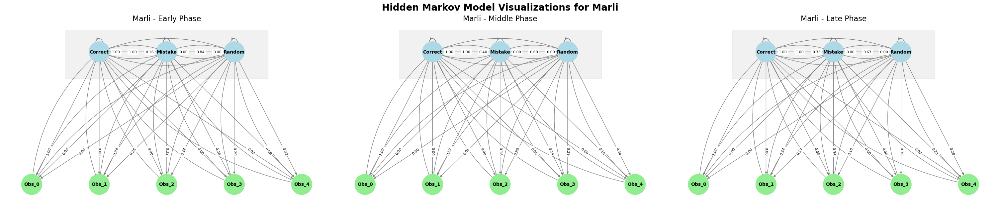

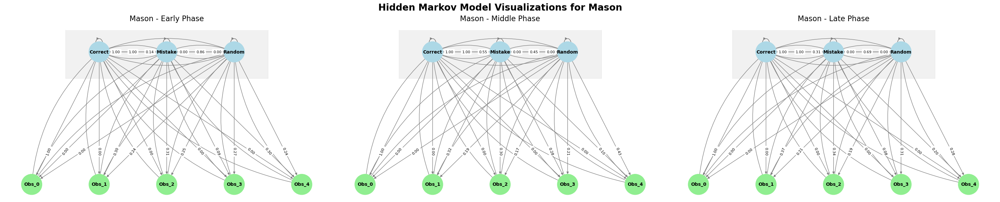

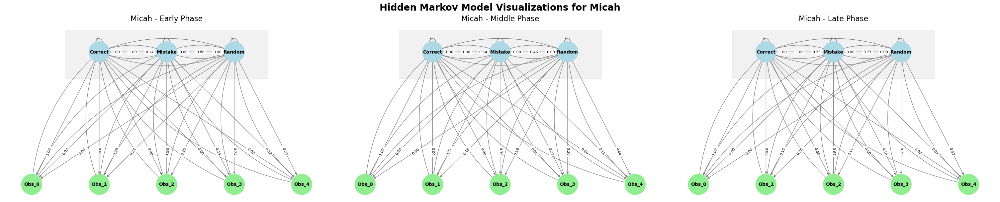

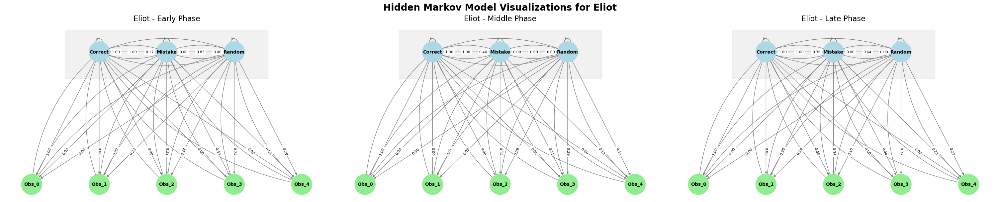

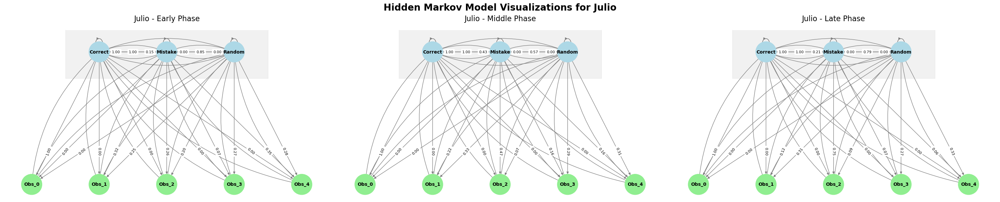

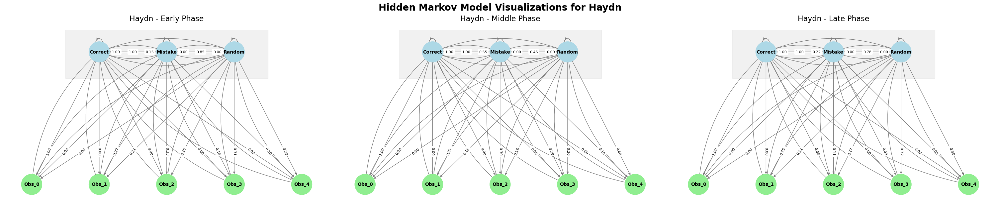

In [30]:
def plot_hmm_phases(hmm_phase_results, animal_name):
    import matplotlib.patches as patches

    # Set up a 1-row, 3-column subplot for Early, Middle, Late phases
    phases = ["Early", "Middle", "Late"]
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 6), constrained_layout=True)  # Adjusted dimensions

    for idx, phase in enumerate(phases):
        best_hmm = hmm_phase_results[animal_name][phase]['best_hmm']

        # Create the directed graph
        graph = nx.MultiDiGraph()  # Use MultiDiGraph for curved edges
        
        # Add hidden states and observation states to the graph
        hidden_states = []
        observation_states = [f"Obs_{i}" for i in range(5)]  # Observations: 0 (home well) to 4 (outer wells)
        for state in best_hmm.states:
            if state.name not in [f"{phase} SFB-start", f"{phase} SFB-end"]:
                graph.add_node(state.name, label=state.name)
                hidden_states.append(state.name)

        for obs in observation_states:
            graph.add_node(obs, label=obs)

        # Add edges with transition probabilities between hidden states
        transition_matrix = best_hmm.dense_transition_matrix()
        for i, state_from in enumerate(best_hmm.states):
            if state_from.name in [f"{phase} SFB-end", f"{phase} SFB-start"]:
                continue  # Skip transitions involving START or END states
            for j, state_to in enumerate(best_hmm.states):
                if (
                    transition_matrix[i, j] > 0
                    and state_to.name not in [f"{phase} SFB-start", f"{phase} SFB-end"]
                ):
                    graph.add_edge(
                        state_from.name,
                        state_to.name,
                        weight=transition_matrix[i, j],
                    )

        # Add edges with emission probabilities to observation states
        for i, hidden_state in enumerate(hidden_states):
            emission_probs = best_hmm.states[i].distribution.parameters[0]
            for obs, prob in emission_probs.items():
                obs_name = f"Obs_{obs}"
                graph.add_edge(hidden_state, obs_name, weight=prob)

        # Position nodes: Hidden states on top, observations below
        pos = {}
        for i, hidden_state in enumerate(hidden_states):
            pos[hidden_state] = (i, 1.5)  # Fixed y = 1.5 for hidden states
        for i, obs in enumerate(observation_states):
            pos[obs] = (i - 1, 0)  # Fixed y = 0 for observations, spread along x

        # Plot the graph
        ax = axes[idx]
        ax.set_title(f"{animal_name} - {phase} Phase", fontsize=16, pad=20)

        # Draw the graph
        nx.draw(
            graph,
            pos,
            ax=ax,
            with_labels=True,
            node_size=2000,
            nodelist=hidden_states + observation_states,
            node_color=["lightblue"] * len(hidden_states) + ["lightgreen"] * len(observation_states),
            font_size=10,
            font_weight="bold",
            font_color="black",
            edge_color="gray",
        )
        
        # Add curved edges
        edge_labels = {}
        for u, v, data in graph.edges(data=True):
            weight = data.get('weight', 0)
            if weight > 0:
                edge_labels[(u, v)] = f"{weight:.2f}"
                nx.draw_networkx_edges(
                    graph,
                    pos,
                    edgelist=[(u, v)],
                    ax=ax,
                    connectionstyle="arc3,rad=0.2" if u != v else "arc3,rad=0.3",  # Curve self-loops more
                    edge_color="gray",
                )

        # Add edge labels for transition and emission probabilities
        nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels, ax=ax, font_size=8, label_pos=0.25)

        # Highlight hidden states with a rectangle
        x_min, x_max = min(pos[h][0] for h in hidden_states) - 0.5, max(pos[h][0] for h in hidden_states) + 0.5
        ax.add_patch(
            patches.Rectangle(
                (x_min, 1.2),  # Slightly larger y-range for better visibility
                x_max - x_min,
                1,
                color="lightgray",
                alpha=0.3,
                zorder=0,
            )
        )

    # Add a global title for the figure
    fig.suptitle(f"Hidden Markov Model Visualizations for {animal_name}", fontsize=20, weight="bold")
    plt.show()

# Example usage
for animal_name in pv_animals:
    plot_hmm_phases(pv_hmm_phase_results, animal_name)
for animal_name in ['Eliot', 'Julio', 'Haydn']:
    plot_hmm_phases(wt_hmm_phase_results, animal_name)

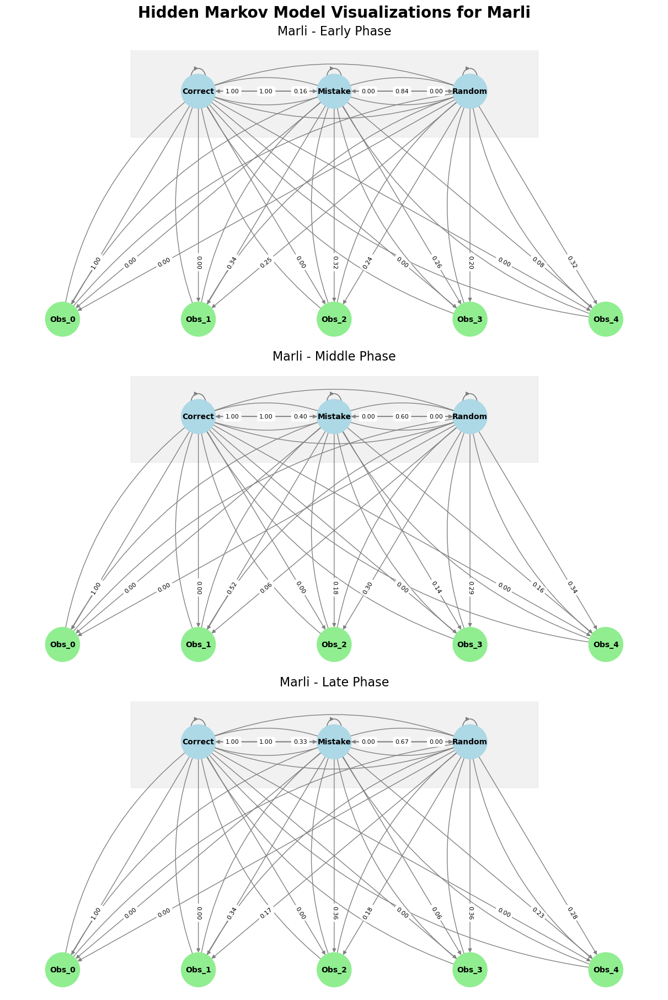

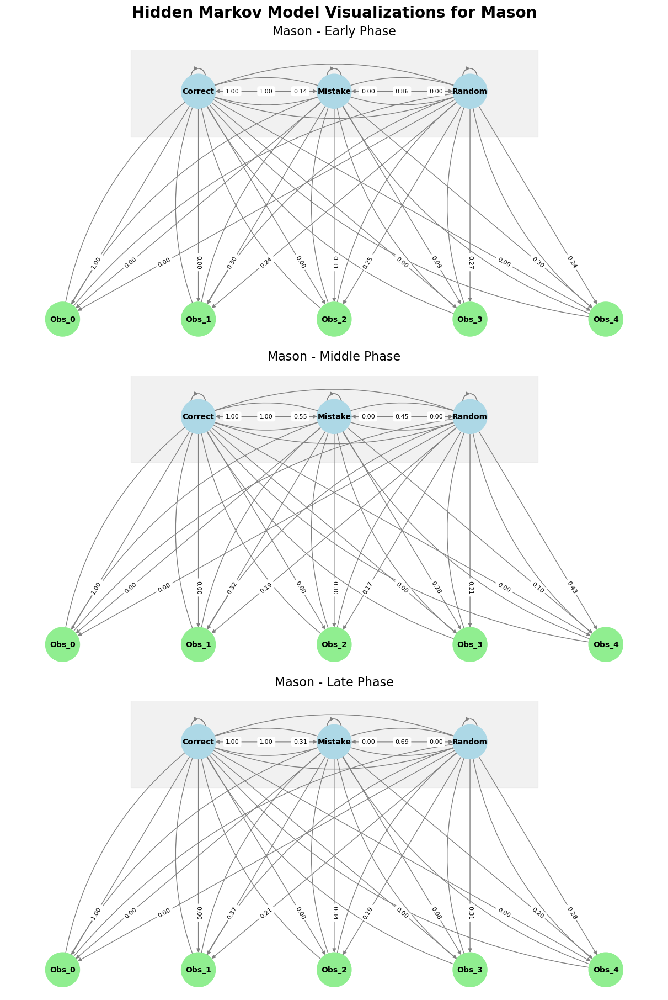

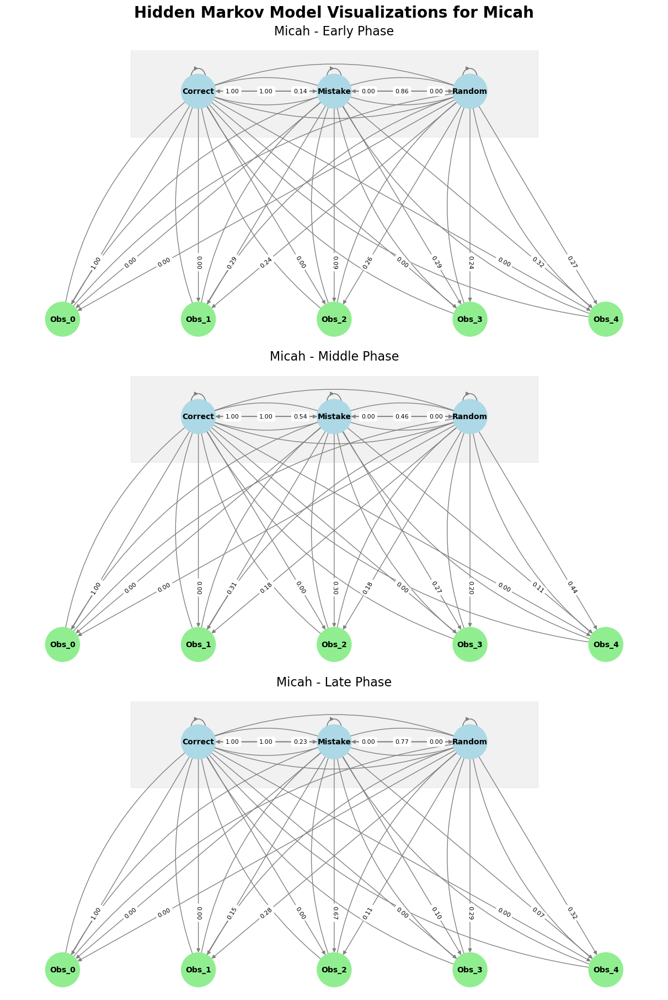

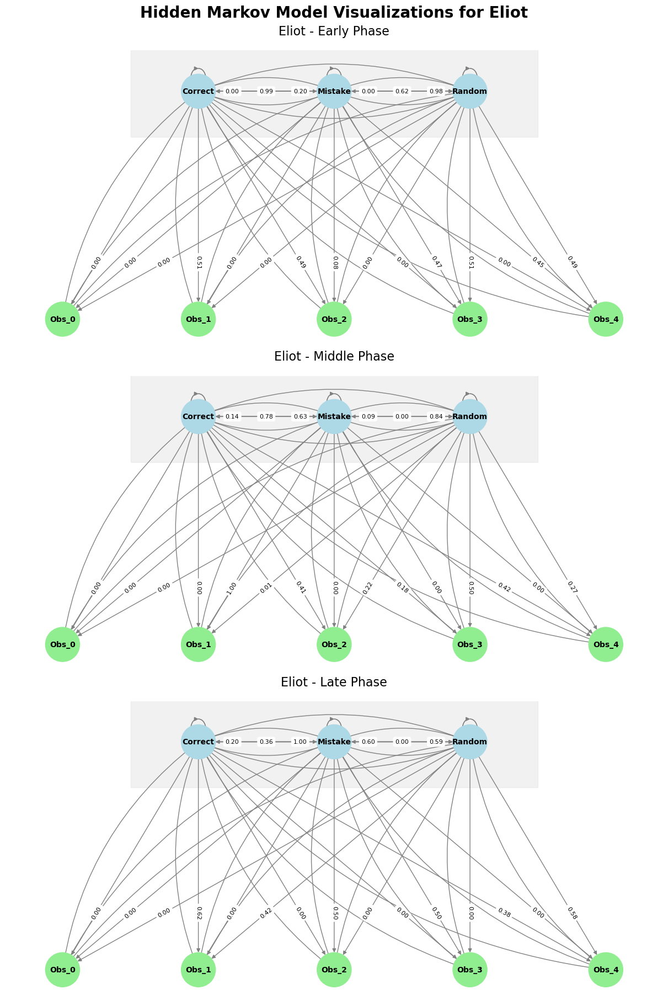

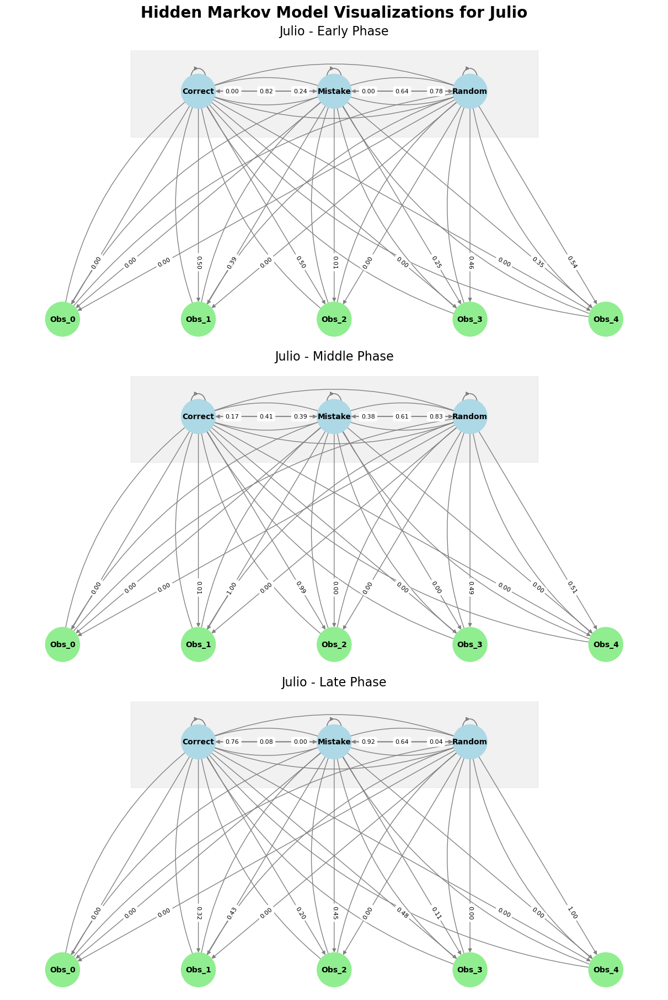

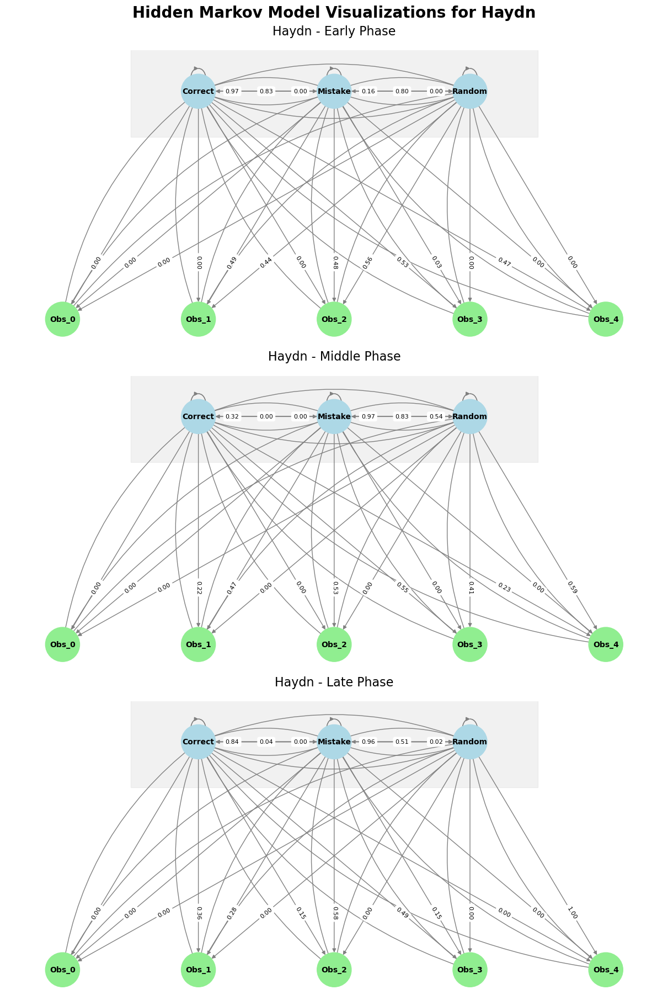

In [ ]:
def plot_hmm_phases(hmm_phase_results, animal_name):
    import matplotlib.patches as patches

    # Set up a 3-row subplot for Early, Middle, Late phases
    phases = ["Early", "Middle", "Late"]
    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 18), constrained_layout=True)

    for idx, phase in enumerate(phases):
        best_hmm = hmm_phase_results[animal_name][phase]['best_hmm']

        # Create the directed graph
        graph = nx.MultiDiGraph()  # Use MultiDiGraph for curved edges
        
        # Add hidden states and observation states to the graph
        hidden_states = []
        observation_states = [f"Obs_{i}" for i in range(5)]  # Observations: 0 (home well) to 4 (outer wells)
        for state in best_hmm.states:
            if state.name not in [f"{phase} SFB-start", f"{phase} SFB-end"]:
                graph.add_node(state.name, label=state.name)
                hidden_states.append(state.name)

        for obs in observation_states:
            graph.add_node(obs, label=obs)

        # Add edges with transition probabilities between hidden states
        transition_matrix = best_hmm.dense_transition_matrix()
        for i, state_from in enumerate(best_hmm.states):
            if state_from.name in [f"{phase} SFB-end", f"{phase} SFB-start"]:
                continue  # Skip transitions involving START or END states
            for j, state_to in enumerate(best_hmm.states):
                if (
                    transition_matrix[i, j] > 0
                    and state_to.name not in [f"{phase} SFB-start", f"{phase} SFB-end"]
                ):
                    graph.add_edge(
                        state_from.name,
                        state_to.name,
                        weight=transition_matrix[i, j],
                    )

        # Add edges with emission probabilities to observation states
        for i, hidden_state in enumerate(hidden_states):
            emission_probs = best_hmm.states[i].distribution.parameters[0]
            for obs, prob in emission_probs.items():
                obs_name = f"Obs_{obs}"
                graph.add_edge(hidden_state, obs_name, weight=prob)

        # Position nodes: Hidden states on top, observations below
        pos = {}
        for i, hidden_state in enumerate(hidden_states):
            pos[hidden_state] = (i, 1.5)  # Fixed y = 1.5 for hidden states
        for i, obs in enumerate(observation_states):
            pos[obs] = (i - 1, 0)  # Fixed y = 0 for observations, spread along x

        # Plot the graph
        ax = axes[idx]
        ax.set_title(f"{animal_name} - {phase} Phase", fontsize=16, pad=20)

        # Draw the graph
        nx.draw(
            graph,
            pos,
            ax=ax,
            with_labels=True,
            node_size=2000,
            nodelist=hidden_states + observation_states,
            node_color=["lightblue"] * len(hidden_states) + ["lightgreen"] * len(observation_states),
            font_size=10,
            font_weight="bold",
            font_color="black",
            edge_color="gray",
        )
        
        # Add curved edges
        edge_labels = {}
        for u, v, data in graph.edges(data=True):
            weight = data.get('weight', 0)
            if weight > 0:
                edge_labels[(u, v)] = f"{weight:.2f}"
                nx.draw_networkx_edges(
                    graph,
                    pos,
                    edgelist=[(u, v)],
                    ax=ax,
                    connectionstyle="arc3,rad=0.2" if u != v else "arc3,rad=0.3",  # Curve self-loops more
                    edge_color="gray",
                )

        # Add edge labels for transition and emission probabilities
        nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels, ax=ax, font_size=8, label_pos = 0.25)

        # Highlight hidden states with a rectangle
        x_min, x_max = min(pos[h][0] for h in hidden_states) - 0.5, max(pos[h][0] for h in hidden_states) + 0.5
        ax.add_patch(
            patches.Rectangle(
                (x_min, 1.2),  # Slightly larger y-range for better visibility
                x_max - x_min,
                1,
                color="lightgray",
                alpha=0.3,
                zorder=0,
            )
        )

    # Add a global title for the figure
    fig.suptitle(f"Hidden Markov Model Visualizations for {animal_name}", fontsize=20, weight="bold")
    plt.show()

# Example usage
for animal_name in pv_animals:
    plot_hmm_phases(pv_hmm_phase_results, animal_name)
# Example usage
for animal_name in ['Eliot', 'Julio', 'Haydn']:
    plot_hmm_phases(wt_hmm_phase_results, animal_name)
